## Imports and logging

In [0]:
from google.colab import files

uploaded = files.upload()

Saving conversation.txt to conversation.txt


In [0]:
# imports needed library

import gensim 
import logging

logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

/usr/local/lib/python3.6/dist-packages/smart_open/ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


## Dataset

In [0]:
data_file_tn='conversation.txt'

with open(data_file_tn, encoding="utf8", errors='ignore') as f:
    for i,line in enumerate (f):
        print(line)

﻿comment faire pour choisir une bonne musique pour samma3ni	"Bonsoir Rimo, c'est simple; consultez le catalogue de toutes les tonalités Samma3ni via le lien suivant:   https://samma3ni.ooredoo.tn/oortn/front/#!/web/home   A votre service 🙂   Lotfi, Community Manager"	Merci, je peux donner nom du musique et mon numero	Est-ce que vous cherchez un titre bien déterminé?     Lotfi, Community Manager	Tu connais, Ya jara	Vous pouvez faire la recherche avec le titre en composant *150*4#.     Lotfi, Community Manager	Vous dites suspendu car pas de solde	Dans ce cas, vous devez recharger votre compte pour que vous piussez acheter la tonalité.   A votre service 🙂    Lotfi, Community Manager	OK, merci bq																	

كان الانترنات غرامك 😎 عليك بالـ Forfait Flexi 7j 📆 و تمتع بـ 1,25 Go انترنات على تليفونك بـ 5 دينارات كهاو 😁😍💯  باش تتمتع بالعرض كمبوزي *124# أكثر تفاصيل على موقعنا : ore.do/flexi-plus	3ad facebook.plus b 4dt w feha 2g fi 30 youm 5ir byaser	تنجم تستعملها ي تيوب	مرحبا ،   لو توضحل

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Été. Mur. Tue.																									

OSTRALIA																									

STORY																									

Comment																									

Orredo																									

ET // NE // ME																									

Été tue Troll																									

TIME WASTING AND STUPID -.-	Saalous																								

Taxi ooredoo r																									

Taxi , fille , famille																									

ارافة منزي ايلة																									

Tue le en																									

Story																									

Troll story net gif																									

Story troll mur																									

Os, tue & story																									

entrnet																									

ooredoo																									

Tue mur story enter troll																									

Story troll mur																									

Bonjour																									

Story																									

Tunis																									

Internet mur reflet																									

Salut ooredoo j'ai une puce mabrouka comment la

## Pre-process and tokenize data

In [0]:
# remove specific ponctuation from txt
import re

punctuation = r"""!"$%&'()+,-;<=>?[\]^`{|}~،؟"""  #only ".*#@:/ " signs are kept
RE_PUNCT = re.compile(r'([%s])+' % re.escape(punctuation), re.UNICODE)

def strip_punctuation(text):
    txt = utils.to_unicode(text)
    return RE_PUNCT.sub(" ", text)

print('Those sign of punctuation were removed: \n', '"!$%&()+,-;<=>?[\]^{|}~،؟' )

Those sign of punctuation were removed: 
 "!$%&()+,-;<=>?[\]^{|}~،؟


In [0]:
pip install emoji

    100% |████████████████████████████████| 51kB 3.9MB/s 


In [0]:
# remove emoji from txt
import emoji

def strip_emoji(text):
    allchars = [str for str in text]
    emoji_list = [c for c in allchars if c in emoji.UNICODE_EMOJI]
    clean_text = ' '.join([str for str in text.split() if not any(i in str for i in emoji_list)])
    return clean_text
  
print('Those emojis were removed: \n')  
emoji.UNICODE_EMOJI

Those emojis were removed: 



{'🥇': ':1st_place_medal:',
 '🥈': ':2nd_place_medal:',
 '🥉': ':3rd_place_medal:',
 '🆎': ':AB_button_(blood_type):',
 '🏧': ':ATM_sign:',
 '🅰': ':A_button_(blood_type):',
 '🇦🇫': ':Afghanistan:',
 '🇦🇱': ':Albania:',
 '🇩🇿': ':Algeria:',
 '🇦🇸': ':American_Samoa:',
 '🇦🇩': ':Andorra:',
 '🇦🇴': ':Angola:',
 '🇦🇮': ':Anguilla:',
 '🇦🇶': ':Antarctica:',
 '🇦🇬': ':Antigua_&_Barbuda:',
 '♒': ':Aquarius:',
 '🇦🇷': ':Argentina:',
 '♈': ':Aries:',
 '🇦🇲': ':Armenia:',
 '🇦🇼': ':Aruba:',
 '🇦🇨': ':Ascension_Island:',
 '🇦🇺': ':Australia:',
 '🇦🇹': ':Austria:',
 '🇦🇿': ':Azerbaijan:',
 '🔙': ':BACK_arrow:',
 '🅱': ':B_button_(blood_type):',
 '🇧🇸': ':Bahamas:',
 '🇧🇭': ':Bahrain:',
 '🇧🇩': ':Bangladesh:',
 '🇧🇧': ':Barbados:',
 '🇧🇾': ':Belarus:',
 '🇧🇪': ':Belgium:',
 '🇧🇿': ':Belize:',
 '🇧🇯': ':Benin:',
 '🇧🇲': ':Bermuda:',
 '🇧🇹': ':Bhutan:',
 '🇧🇴': ':Bolivia:',
 '🇧🇦': ':Bosnia_&_Herzegovina:',
 '🇧🇼': ':Botswana:',
 '🇧🇻': ':Bouvet_Island:',
 '🇧🇷': ':Brazil:',
 '🇮🇴': ':British_Indian_Ocean_Territory:',
 '🇻🇬': ':British_Vir

In [0]:
def strip_multichar(text):
  clean_text = re.sub(r'(.)\1+', r'\1\1', text)   
  return clean_text

In [0]:
from gensim import utils
from gensim.parsing.preprocessing import preprocess_string
from gensim.parsing.preprocessing import strip_short

# order in filters' function counts!
filters = [lambda x: x.lower(), strip_punctuation, lambda x: strip_emoji(x), lambda x : strip_multichar(x), lambda x: strip_short(x, minsize=4)]

In [0]:
def read_input(input_file, filters):
    """This method reads the input file which is in .txt format"""
    
    logging.info("reading file {0}...this may take a while".format(input_file))
    
    with open(input_file, 'rb') as f:
        for i, line in enumerate(f): 
            if (i%10000==0):
                logging.info ("read {0} conversations".format (i))
            # do some pre-processing and return a list of words for each review text
            yield preprocess_string(line, filters)
            #yield gensim.utils.simple_preprocess(line,  deacc=True, min_len=4, max_len=15)

# read the tokenized conversations into a list
# each review item becomes a serries of words
documents_tn = list (read_input(data_file_tn, filters))
logging.info ("Done reading Tunisian data file")
print("\n Done lowcasing, removing punctuation, emojis, multiplicated characters, and words that size are less than 3")

2019-04-29 08:18:03,044 : INFO : reading file conversation.txt...this may take a while
2019-04-29 08:18:03,046 : INFO : read 0 conversations
2019-04-29 08:18:03,734 : INFO : read 10000 conversations
2019-04-29 08:18:04,453 : INFO : read 20000 conversations
2019-04-29 08:18:05,127 : INFO : read 30000 conversations
2019-04-29 08:18:05,755 : INFO : read 40000 conversations
2019-04-29 08:18:05,860 : INFO : Done reading Tunisian data file



 Done lowcasing, removing punctuation, emojis, multiplicated characters, and words that size are less than 3


In [0]:
documents_tn

[['\ufeffcomment',
  'faire',
  'pour',
  'choisir',
  'bonne',
  'musique',
  'pour',
  'samma3ni',
  'bonsoir',
  'rimo',
  'simple',
  'consultez',
  'catalogue',
  'toutes',
  'tonalités',
  'samma3ni',
  'lien',
  'suivant:',
  'https://samma3ni.ooredoo.tn/oortn/front/#',
  '/web/home',
  'votre',
  'service',
  'lotfi',
  'community',
  'manager',
  'merci',
  'peux',
  'donner',
  'musique',
  'numero',
  'vous',
  'cherchez',
  'titre',
  'bien',
  'déterminé',
  'lotfi',
  'community',
  'manager',
  'connais',
  'jara',
  'vous',
  'pouvez',
  'faire',
  'recherche',
  'avec',
  'titre',
  'composant',
  '*150*4#.',
  'lotfi',
  'community',
  'manager',
  'vous',
  'dites',
  'suspendu',
  'solde',
  'dans',
  'vous',
  'devez',
  'recharger',
  'votre',
  'compte',
  'pour',
  'vous',
  'piussez',
  'acheter',
  'tonalité.',
  'votre',
  'service',
  'lotfi',
  'community',
  'manager',
  'merci'],
 ['الانترنات',
  'غرامك',
  'عليك',
  'بالـ',
  'forfait',
  'flexi',
  'تمت

## Create vocabulary words

In [0]:
# create vocaubulary = a set of unique words
model_tn = gensim.models.Word2Vec(documents_tn, size=150, window=5, min_count=5, workers=10, sg=1, iter=10, compute_loss=True)

2019-04-29 08:18:44,194 : WARNING : consider setting layer size to a multiple of 4 for greater performance
2019-04-29 08:18:44,195 : INFO : collecting all words and their counts
2019-04-29 08:18:44,197 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2019-04-29 08:18:44,240 : INFO : PROGRESS: at sentence #10000, processed 105515 words, keeping 18030 word types
2019-04-29 08:18:44,283 : INFO : PROGRESS: at sentence #20000, processed 218788 words, keeping 29736 word types
2019-04-29 08:18:44,323 : INFO : PROGRESS: at sentence #30000, processed 320950 words, keeping 39540 word types
2019-04-29 08:18:44,363 : INFO : PROGRESS: at sentence #40000, processed 418373 words, keeping 47481 word types
2019-04-29 08:18:44,370 : INFO : collected 49767 word types from a corpus of 433593 raw words and 41697 sentences
2019-04-29 08:18:44,372 : INFO : Loading a fresh vocabulary
2019-04-29 08:18:44,545 : INFO : effective_min_count=5 retains 9576 unique words (19% of original 497

## Train the Word2Vect Model

In [0]:
model_tn.train(documents_tn,total_examples=len(documents_tn),epochs=10)

2019-04-29 08:19:55,647 : WARNING : Effective 'alpha' higher than previous training cycles
2019-04-29 08:19:55,649 : INFO : training model with 10 workers on 9576 vocabulary and 150 features, using sg=1 hs=0 sample=0.001 negative=5 window=5
2019-04-29 08:19:56,751 : INFO : EPOCH 1 - PROGRESS: at 54.07% examples, 155787 words/s, in_qsize 19, out_qsize 0
2019-04-29 08:19:57,174 : INFO : worker thread finished; awaiting finish of 9 more threads
2019-04-29 08:19:57,180 : INFO : worker thread finished; awaiting finish of 8 more threads
2019-04-29 08:19:57,181 : INFO : worker thread finished; awaiting finish of 7 more threads
2019-04-29 08:19:57,189 : INFO : worker thread finished; awaiting finish of 6 more threads
2019-04-29 08:19:57,197 : INFO : worker thread finished; awaiting finish of 5 more threads
2019-04-29 08:19:57,210 : INFO : worker thread finished; awaiting finish of 4 more threads
2019-04-29 08:19:57,220 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-04-

(3077260, 4335930)

In [0]:
model_tn.get_latest_training_loss()

0.0

In [0]:
print(model_tn)

Word2Vec(vocab=9576, size=150, alpha=0.025)


## Some Output

In [0]:
# Compute L2-norms of word weight vectors to get the top10 most similar words to w1
w1 = 'كارطة'
model_tn.wv.most_similar(positive=w1, topn=10)


2019-04-29 08:20:25,069 : INFO : precomputing L2-norms of word weight vectors
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('مانصب', 0.8310374617576599),
 ('تيكاي', 0.7759357690811157),
 ('منشرجي', 0.766913890838623),
 ('مايجيني', 0.7641716599464417),
 ('ميرسي', 0.7632380723953247),
 ('تنحيولي', 0.759114682674408),
 ('نقطه', 0.758668065071106),
 ('الصولد', 0.753197431564331),
 ('الافر', 0.7519554495811462),
 ('النفاق', 0.7517908215522766)]

In [0]:
# Compute L2-norms of word weight vectors to get the top10 most similar words to w1
w2 = 'ta7wil'
model_tn.wv.most_similar(positive=w2, topn=30)

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('net.', 0.7019553780555725),
 ('للتحويل', 0.6710740923881531),
 ('compatible', 0.6659610271453857),
 ('*120#', 0.6298624277114868),
 ('إرساله', 0.6170957684516907),
 ('أنترنت', 0.6134663224220276),
 ('kado', 0.6117175817489624),
 ('dépanne', 0.606623113155365),
 ('أخر.', 0.5948691368103027),
 ('*121#', 0.5933239459991455),
 ('quels', 0.5815636515617371),
 ('nb3th', 0.5783701539039612),
 ('http://ww.ooredoo.tn/particuliers/ta7wil', 0.5632493495941162),
 ('يضرب', 0.5606622099876404),
 ('ltlf', 0.5563712120056152),
 ('إختر', 0.5463191270828247),
 ('latifa', 0.5400767922401428),
 ('إتبع', 0.5328512191772461),
 ('يقصولي', 0.5300242304801941),
 ('transferts', 0.529572069644928),
 ('valables', 0.5292152166366577),
 ('*155#', 0.5283322334289551),
 ('رصيد', 0.526181161403656),
 ('revanche', 0.5239802598953247),
 ('يبعثش', 0.5225484371185303),
 ('paramétrage', 0.5206007361412048),
 ('100mo', 0.5199673175811768),
 ('compatibles', 0.517899215221405),
 ('http://ww.espaceclient.eddenyalive.com', 0

In [0]:
# Compute L2-norms of word weight vectors to get the top10 most similar words to w1
w3= 'البوس'
model_tn.wv.most_similar(positive=w3, topn=10)

KeyError: ignored

In [0]:
# Get similarity between two different words
model_tn.wv.similarity(w1='اووريدوو',w2="ooredoo")

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


0.1930328

In [0]:
# Get similarity between two different words
model_tn.wv.similarity(w1='forfait',w2="الفرفاي")


/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


0.42774668

In [0]:
# Which one is the odd one out in this list?
model_tn.wv.doesnt_match(["مودام","connexion", "الانترنت", "team"])


/usr/local/lib/python3.6/dist-packages/gensim/models/keyedvectors.py:895: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  vectors = vstack(self.word_vec(word, use_norm=True) for word in used_words).astype(REAL)
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


'team'

## Show some stored model variables

In [0]:
# store weight vectors of the hidden layers of the neural network 
# weight vectors are also w2v representation of the vocabulary words
wordvectors_tn = model_tn.wv 

In [0]:
# Print the learned vocabulary of tokens (words)
vocabulary_tn = list(wordvectors_tn.vocab)
print(vocabulary_tn)

['faire', 'pour', 'choisir', 'bonne', 'musique', 'samma3ni', 'bonsoir', 'simple', 'consultez', 'catalogue', 'toutes', 'tonalités', 'lien', 'suivant:', 'https://samma3ni.ooredoo.tn/oortn/front/#', '/web/home', 'votre', 'service', 'lotfi', 'community', 'manager', 'merci', 'peux', 'donner', 'numero', 'vous', 'titre', 'bien', 'connais', 'pouvez', 'recherche', 'avec', 'composant', 'dites', 'suspendu', 'solde', 'dans', 'devez', 'recharger', 'compte', 'acheter', 'الانترنات', 'عليك', 'forfait', 'flexi', 'تمتع', 'انترنات', 'تليفونك', 'دينارات', 'كهاو', 'تتمتع', 'بالعرض', 'كمبوزي', '*124#', 'أكثر', 'تفاصيل', 'موقعنا', 'plus', 'feha', 'youm', 'تنجم', 'تستعملها', 'مرحبا', 'توضحلي', 'الطلب', 'متاعك', 'faten', 'team', 'ooredoo', 'assistance', 'ouii', 'chayy', 'tunisie', 'na7ki', 'hadha', 'mta3', 'salut', 'akkari', 'facebook', 'postpayé', 'donc', 'concerne', 'lignes', 'raouf', 'ligne', 'business', 'bénéficier', 'forfait.', 'intérêt', 'عندي', 'سؤال:', 'وقتلي', 'شريت', 'اوريدو', 'يتجدد', 'نستعمل', 'الر

In [0]:
# Print the learned representation of tokens (words)
vector_tn = wordvectors_tn.word_vec('نومروك')
print(vector_tn)

[ 0.2632005   0.3319235   0.1406759   0.50896263  0.03713161 -0.04187121
  0.19873193  0.30248776  0.46390343  0.22946785 -0.4762614  -0.15414128
  0.5034236   0.17654324 -0.20770295  0.61914706 -0.3711511  -0.56311995
  0.6584818  -0.19444862  0.2189674  -0.08705141  0.12818438 -0.3892159
 -0.48298234 -0.8057205  -0.13418631  0.37686762 -0.35629043  0.23303582
 -0.5021622  -0.4333681  -0.16758266 -0.07963619  0.3924286  -0.12203265
 -0.3487845   0.29858074  0.1522066  -0.19867985  0.17854042  0.10916915
 -0.20093146  0.09351277 -0.30174178  0.5644044   0.16633853  0.04713807
  0.32247195  0.06503589 -0.2551308   0.37415645 -0.06036431 -0.02998564
  0.03510813 -0.19720526 -0.04021506 -0.32866845  0.20968136 -0.3984929
  0.17780977 -0.6351762   0.07309698 -0.7095844   0.3992389   0.07142756
 -0.46774873 -0.3205295  -0.08138973 -0.20220509 -0.30682296 -0.04332659
  0.68923855 -0.7053072   0.00453162 -0.54327744  0.14627893  0.29870465
 -0.197715   -0.12626532 -0.3858202  -0.32610694 -0.1

## Store the model as word embedding file 

In [0]:
# Save the trained model into model.bin file
# By default, the model is saved in a binary format to save space
model_tn.save('model_tn.bin')
print('Saved model:', model_tn)

# load model
new_model_tn = gensim.models.Word2Vec.load('model_tn.bin')
print('Loaded model:', new_model_tn)

2019-04-29 08:20:52,520 : INFO : saving Word2Vec object under model_tn.bin, separately None
2019-04-29 08:20:52,522 : INFO : not storing attribute vectors_norm
2019-04-29 08:20:52,527 : INFO : not storing attribute cum_table
2019-04-29 08:20:52,530 : WARNING : this function is deprecated, use smart_open.open instead
2019-04-29 08:20:52,716 : INFO : saved model_tn.bin
2019-04-29 08:20:52,718 : INFO : loading Word2Vec object from model_tn.bin
2019-04-29 08:20:52,719 : WARNING : this function is deprecated, use smart_open.open instead
2019-04-29 08:20:52,834 : INFO : loading wv recursively from model_tn.bin.wv.* with mmap=None
2019-04-29 08:20:52,835 : INFO : setting ignored attribute vectors_norm to None
2019-04-29 08:20:52,836 : INFO : loading vocabulary recursively from model_tn.bin.vocabulary.* with mmap=None
2019-04-29 08:20:52,837 : INFO : loading trainables recursively from model_tn.bin.trainables.* with mmap=None
2019-04-29 08:20:52,838 : INFO : setting ignored attribute cum_table

Saved model: Word2Vec(vocab=9576, size=150, alpha=0.025)
Loaded model: Word2Vec(vocab=9576, size=150, alpha=0.025)


## Plot hole vocabulary as Word Vectors (3D plot)

In [0]:
# Extract all vocabulary word vectors
X_tn = model_tn[vocabulary_tn]
print(X_tn)

[[ 0.01824401  1.0084039  -1.2003443  ... -0.44136438 -0.19864373
  -0.05030024]
 [ 0.61661816  0.2457365  -0.6330655  ... -0.11730838 -0.52023184
  -0.4301151 ]
 [-0.18767163 -0.23417601 -0.6992884  ... -0.5156847  -0.05543942
   0.14643373]
 ...
 [-0.0192999   0.05570691 -0.03461941 ... -0.04124694 -0.17130333
   0.02336844]
 [-0.12713529  0.16531383  0.02149216 ... -0.02672485 -0.1490487
   0.07547425]
 [-0.03243656  0.19300954 -0.15234146 ... -0.14592992 -0.15618563
  -0.0222762 ]]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


In [0]:
#  Create a 3-dimensional PCA model of the word vectors
from sklearn.decomposition import PCA

pca3 = PCA(n_components=3)
projection_tn03 = pca3.fit_transform(X_tn)

In [0]:
pip install --upgrade arabic-reshaper


In [0]:
pip install python-bidi

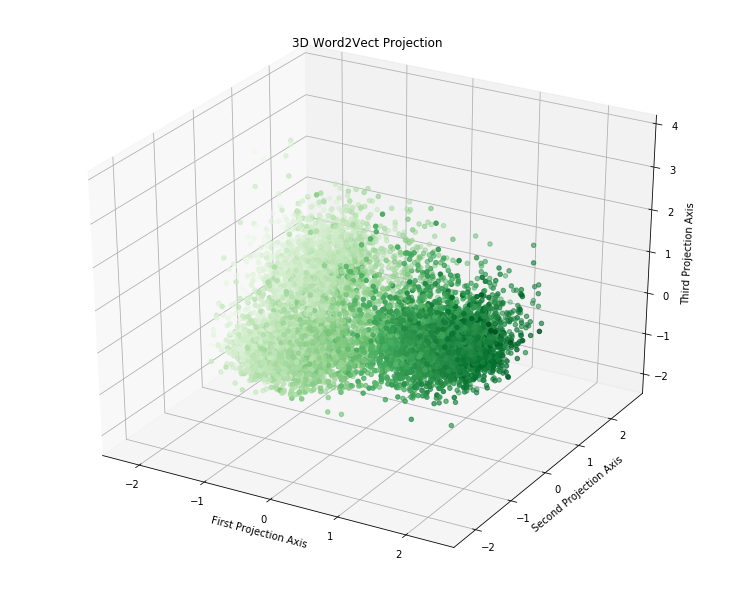

In [0]:
import arabic_reshaper
from bidi.algorithm import get_display

# Plot the resulting projection
# The dots are annotated with the words
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook
%matplotlib inline 
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(10,8))
ax = Axes3D(fig)

# create a scatter plot of the projection
ax.scatter3D(projection_tn03[:, 0], projection_tn03[:, 1], projection_tn03[:, 2], c = projection_tn03[:, 0], cmap='Greens')
# add title and axis names
plt.title('3D Word2Vect Projection')
ax.set_xlabel('First Projection Axis')
ax.set_ylabel('Second Projection Axis')
ax.set_zlabel('Third Projection Axis')

plt.show()

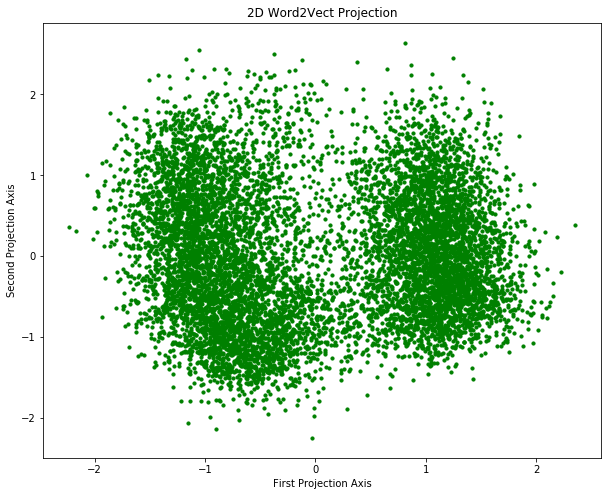

In [0]:
plt.figure(figsize=(10,8))

# create a scatter plot of the projection
plt.scatter(projection_tn03[:, 0], projection_tn03[:, 1], s = 10, c='green')
# add title and axis names
plt.title('2D Word2Vect Projection')
plt.xlabel('First Projection Axis')
plt.ylabel('Second Projection Axis')

plt.show()

## Plot hole vocabulary as Word Vectors (2D plot)

In [0]:
#  Create a 2-dimensional PCA model of the word vectors
from sklearn.decomposition import PCA

pca2 = PCA(n_components=2)
projection_tn02 = pca2.fit_transform(X_tn)

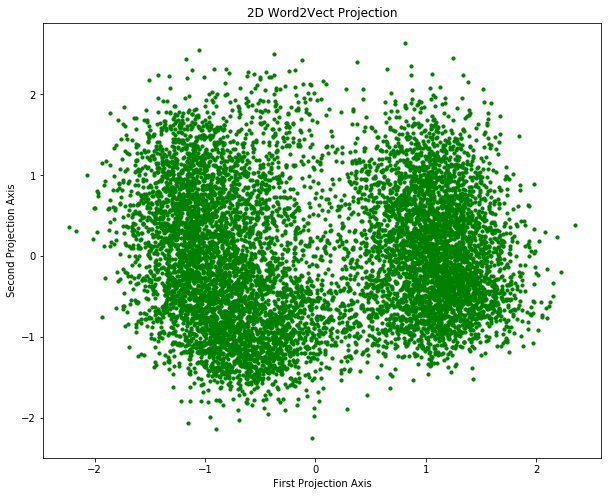

In [0]:
plt.figure(figsize=(10,8))

# create a scatter plot of the projection
plt.scatter(projection_tn02[:, 0], projection_tn02[:, 1], s = 10, c='green')
# add title and axis names
plt.title('2D Word2Vect Projection')
plt.xlabel('First Projection Axis')
plt.ylabel('Second Projection Axis')

plt.show()

## Plot parts of vocabulary as Word Vectors (2D plot)

In [0]:
small_vocab_tn = vocabulary_tn[0:300]
small_X_tn = model_tn[small_vocab_tn]

#  Create a 2-dimensional PCA model of the word vectors
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
projection_tn = pca.fit_transform(small_X_tn)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


/usr/local/lib/python3.6/dist-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Lohit Devanagari'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


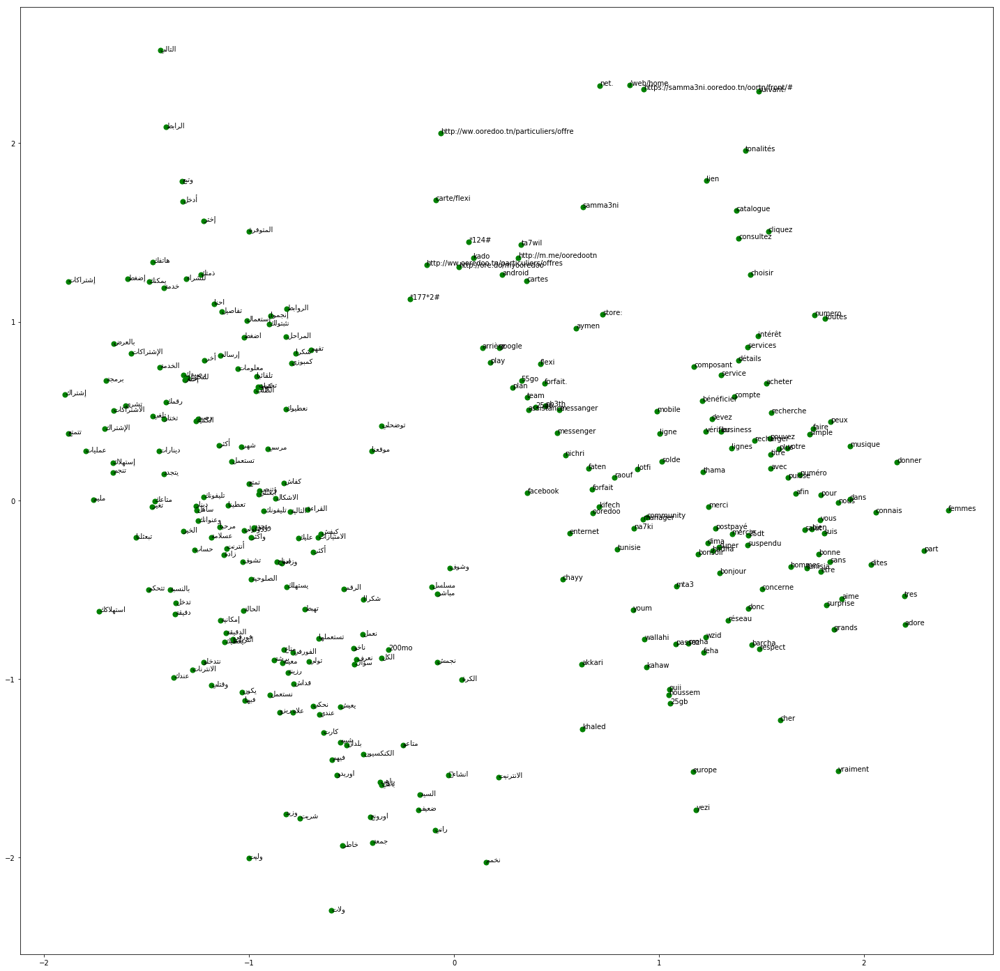

In [0]:
import arabic_reshaper
from bidi.algorithm import get_display

# Plot the resulting projection
# The dots are annotated with the words
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook
%matplotlib inline 

plt.figure(figsize=(25,25))

# create a scatter plot of the projection
plt.scatter(projection_tn[:, 0], projection_tn[:, 1], s = 50, c='green')


plt.rc('font', family='Lohit Devanagari')
for i, word in enumerate(small_vocab_tn):
	plt.annotate(get_display(arabic_reshaper.reshape(word)), xy=(projection_tn[i, 0], projection_tn[i, 1]), size=10)
  
  
plt.show()


In [0]:
small_vocab_tn1 = vocabulary_tn[7000:7300]
small_X_tn1 = model_tn[small_vocab_tn1]

#  Create a 2-dimensional PCA model of the word vectors
from sklearn.decomposition import PCA

projection_tn1 = pca.fit_transform(small_X_tn1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


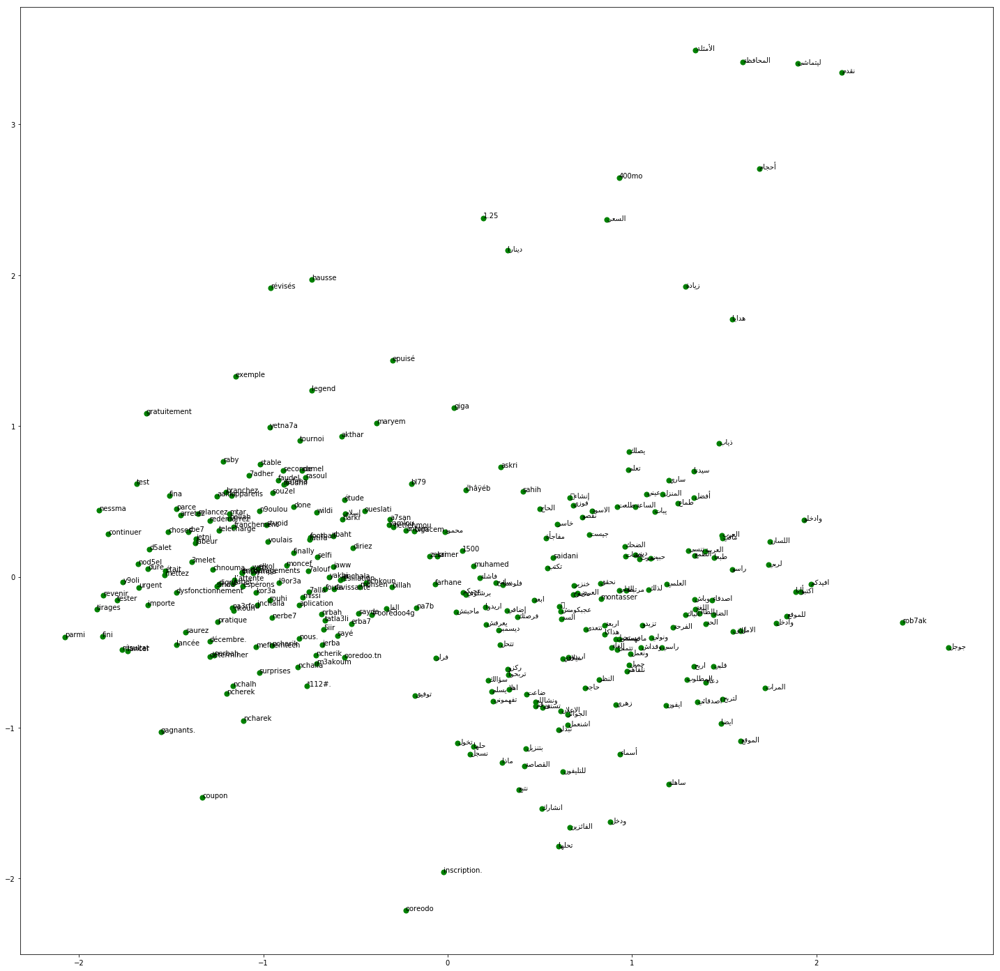

In [0]:
# Plot the resulting projection
# The dots are annotated with the words
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook
%matplotlib inline 

plt.figure(figsize=(25,25))

# create a scatter plot of the projection
plt.scatter(projection_tn1[:, 0], projection_tn1[:, 1], s = 50, c='green')


plt.rc('font', family='Lohit Devanagari')
for i, word in enumerate(small_vocab_tn1):
	plt.annotate(get_display(arabic_reshaper.reshape(word)), xy=(projection_tn1[i, 0], projection_tn1[i, 1]), size=10)
plt.show()


## Plot similar words from vocabulary as Word Vectors (2D plot)

In [0]:
# selecting key words for later visualisation


keys_narab = ['تونس', 'كارتة', 'الفرفاي', 'ميڨا', 'البوكس', 'كريدي', 'لبوتيك', 'بوانات', 'التاليفون','اووريدوو']
keys_varab = ['نشريه', 'شرجيت', 'ننصحك', 'قصيتولي', 'نكلم', 'اتخلصو', 'كونكتاي', 'نختار' , 'يربح','برتاجي']

keys_nlatin = ['kridi', 'tounes', 'kado', 'teliphoun', 'floussi', 'samma3ni', 'bonus', 'ooredoo' , 'ta7wil','tore7']
keys_vlatin = ['saretli', 'chritou', 'thama', 'yotlobni', 'mafhemtch', 'nestana', 'tnajam', 'mayemchich' , 'tconsomi','isob']

keys_tn     = ['تونس', 'كارتة', 'الفرفاي', 'ميڨا', 'البوكس', 'كريدي', 'لبوتيك', 'بوانات', 'التاليفون','اووريدوو', 'kridi', 'tounes', 'kado', 'teliphoun', 'floussi', 'samma3ni', 'bonus', 'ooredoo' , 'ta7wil','tore7']


In [0]:
embedding_clusters_gif = []
word_clusters_gif = []

for word in keys_tn:
    embeddings = []
    words = []
    for similar_word, _ in model_tn.most_similar(word, topn=200):
        words.append(similar_word)
        embeddings.append(model_tn[similar_word])
    embedding_clusters_gif.append(embeddings)
    word_clusters_gif.append(words)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  import sys
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


In [0]:
import numpy as np

embedding_clusters_gif = np.array(embedding_clusters_gif)
n, m, k = embedding_clusters_gif.shape

2019-04-29 09:00:38,493 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:00:38,505 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:00:38,513 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:00:38,524 : WARNING : 'c' arg

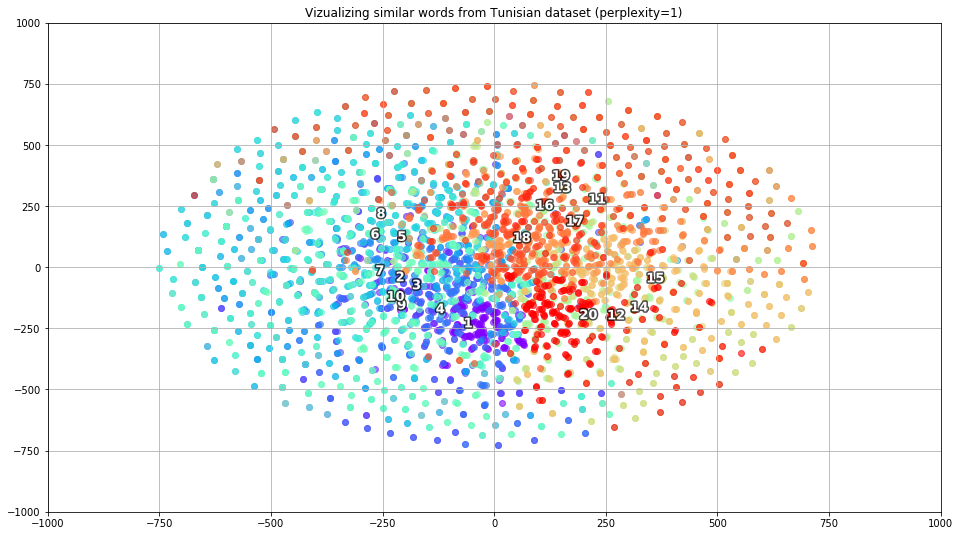

2019-04-29 09:02:16,275 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:02:16,285 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:02:16,294 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:02:16,303 : WARNING : 'c' arg

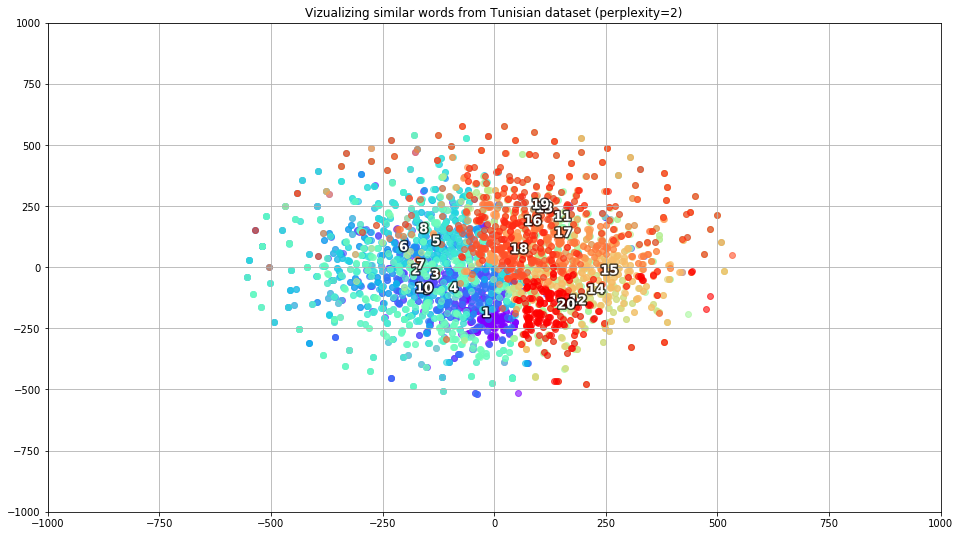

2019-04-29 09:03:53,774 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:03:53,780 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:03:53,787 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:03:53,793 : WARNING : 'c' arg

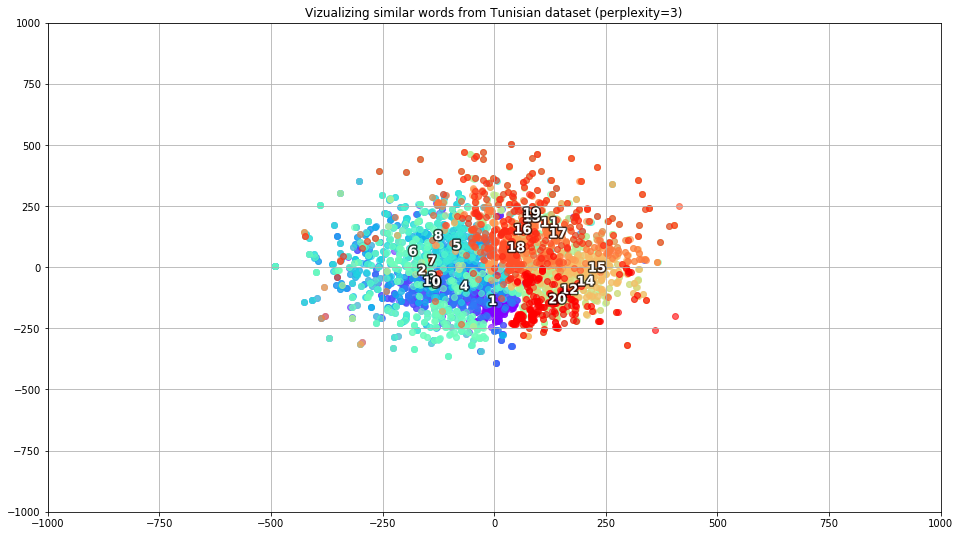

2019-04-29 09:05:37,157 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:05:37,163 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:05:37,170 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:05:37,179 : WARNING : 'c' arg

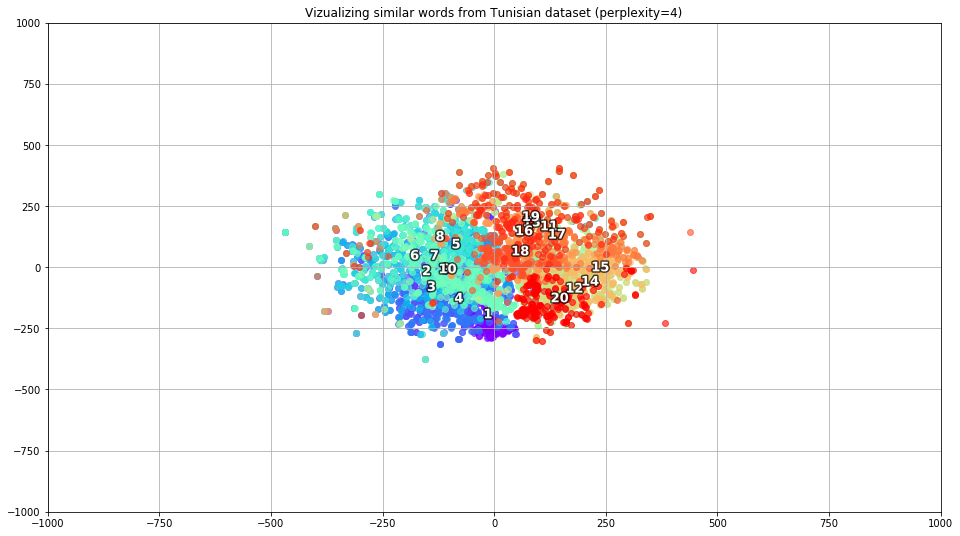

2019-04-29 09:07:22,652 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:07:22,663 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:07:22,672 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:07:22,680 : WARNING : 'c' arg

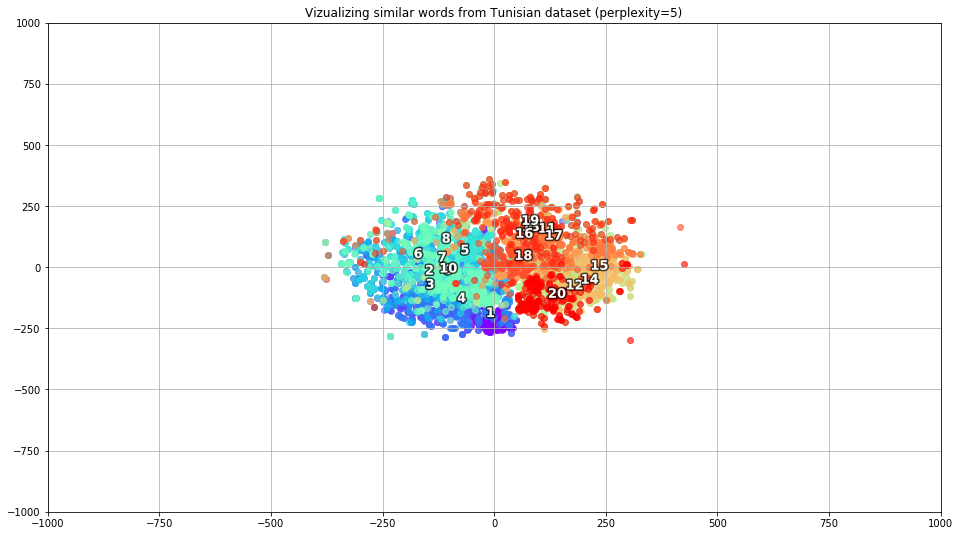

2019-04-29 09:09:02,808 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:09:02,814 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:09:02,821 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:09:02,830 : WARNING : 'c' arg

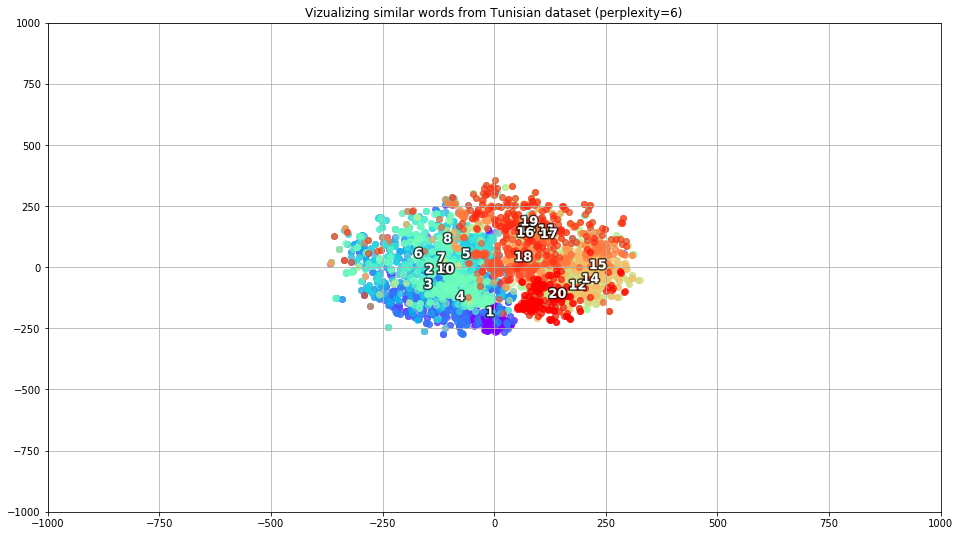

2019-04-29 09:10:45,010 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:10:45,018 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:10:45,028 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:10:45,034 : WARNING : 'c' arg

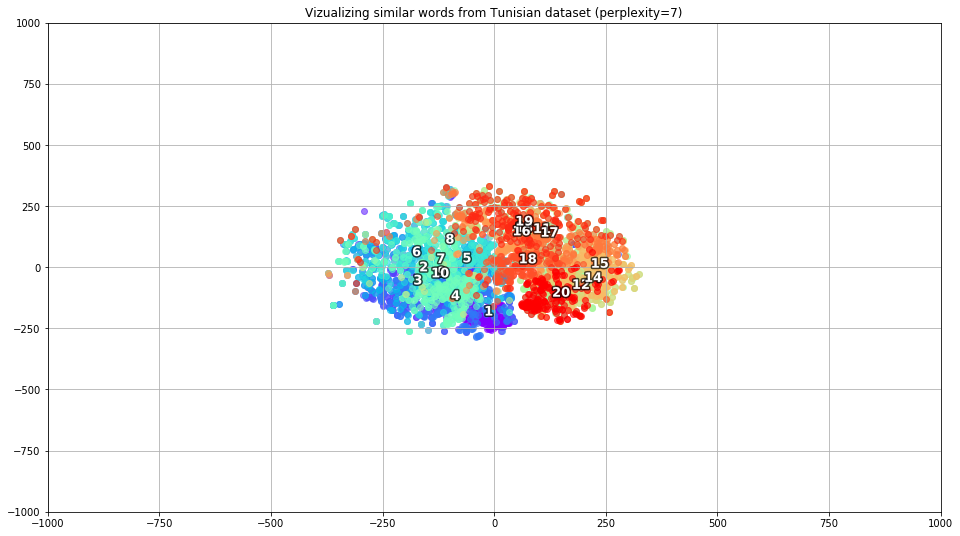

2019-04-29 09:12:33,136 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:12:33,150 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:12:33,159 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:12:33,169 : WARNING : 'c' arg

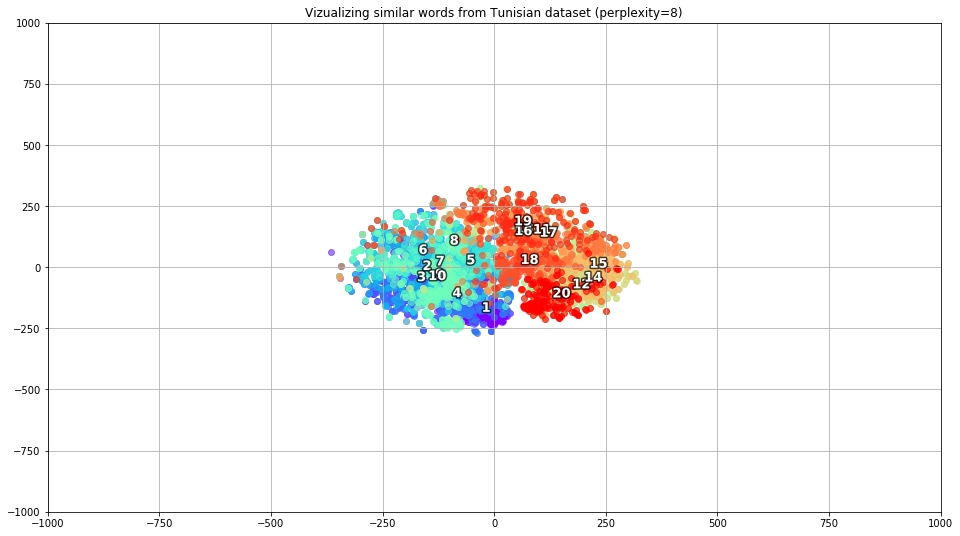

2019-04-29 09:14:16,933 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:14:16,939 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:14:16,947 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:14:16,954 : WARNING : 'c' arg

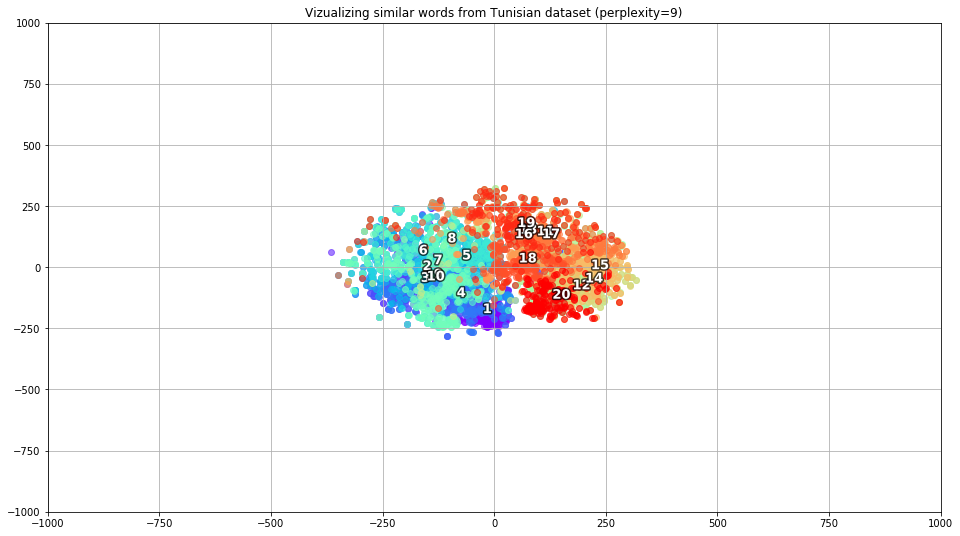

2019-04-29 09:16:00,898 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:16:00,905 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:16:00,913 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:16:00,919 : WARNING : 'c' arg

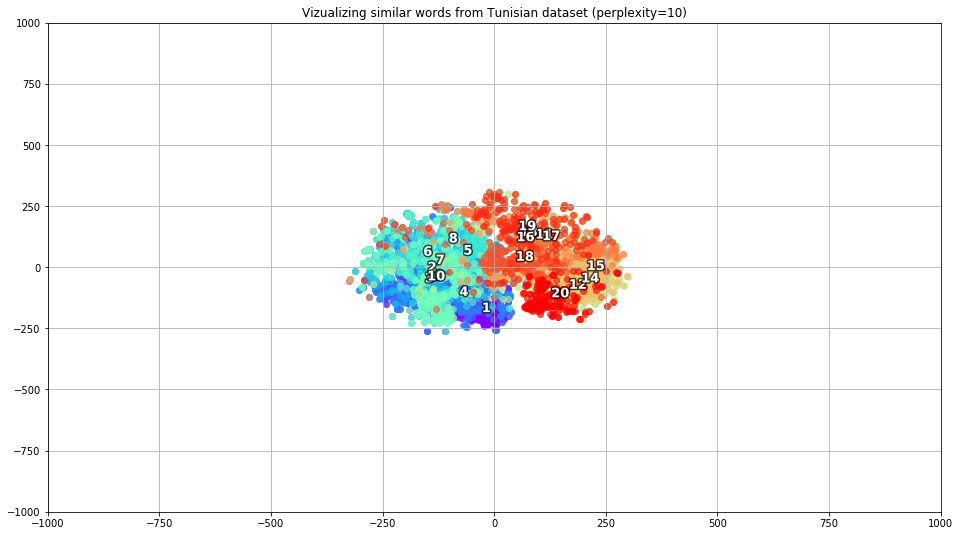

2019-04-29 09:17:48,926 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:17:48,936 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:17:48,945 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:17:48,955 : WARNING : 'c' arg

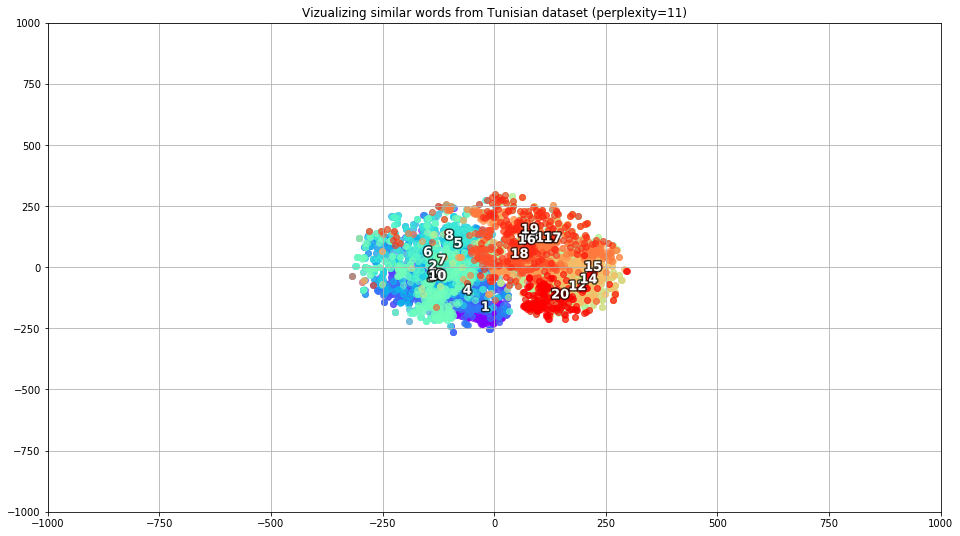

2019-04-29 09:19:41,487 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:19:41,493 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:19:41,499 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:19:41,507 : WARNING : 'c' arg

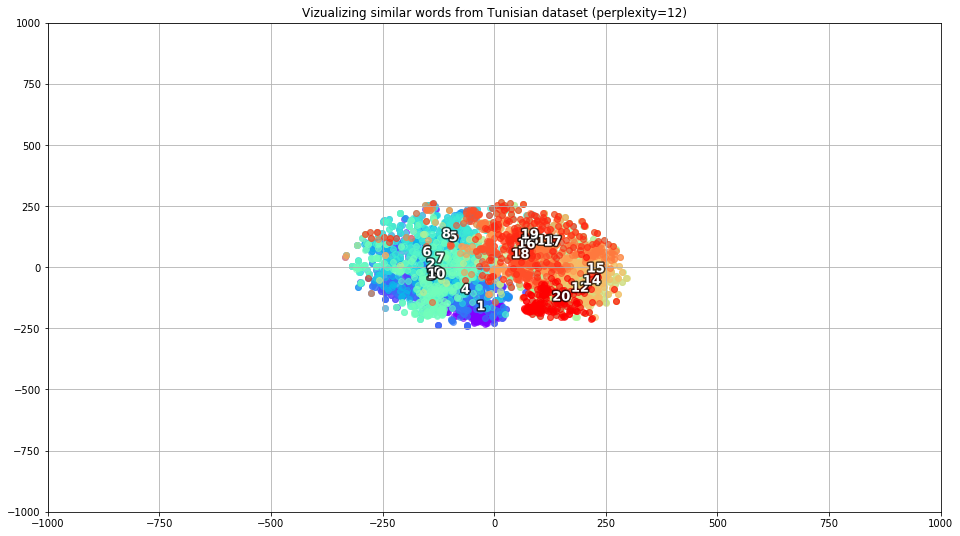

2019-04-29 09:21:41,376 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:21:41,383 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:21:41,389 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:21:41,398 : WARNING : 'c' arg

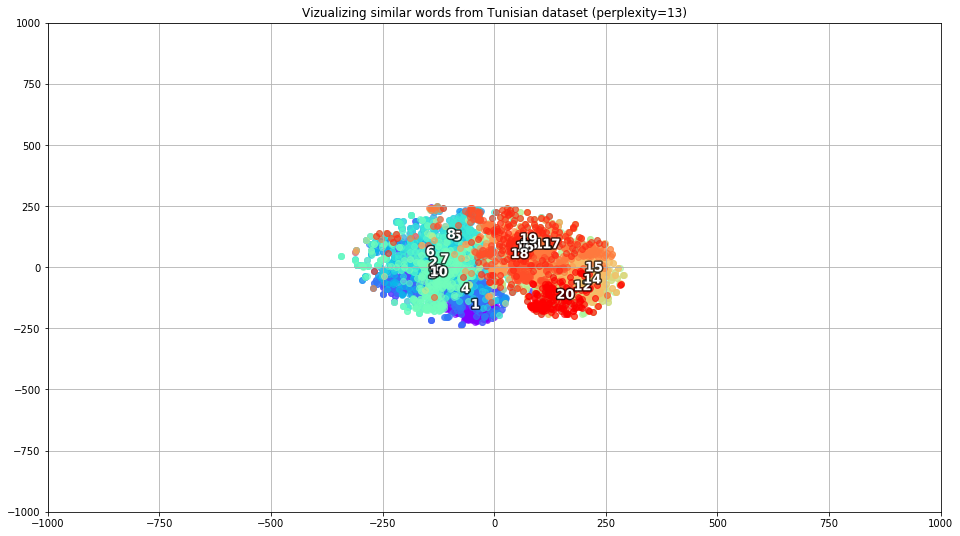

2019-04-29 09:23:40,231 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:23:40,237 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:23:40,243 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:23:40,250 : WARNING : 'c' arg

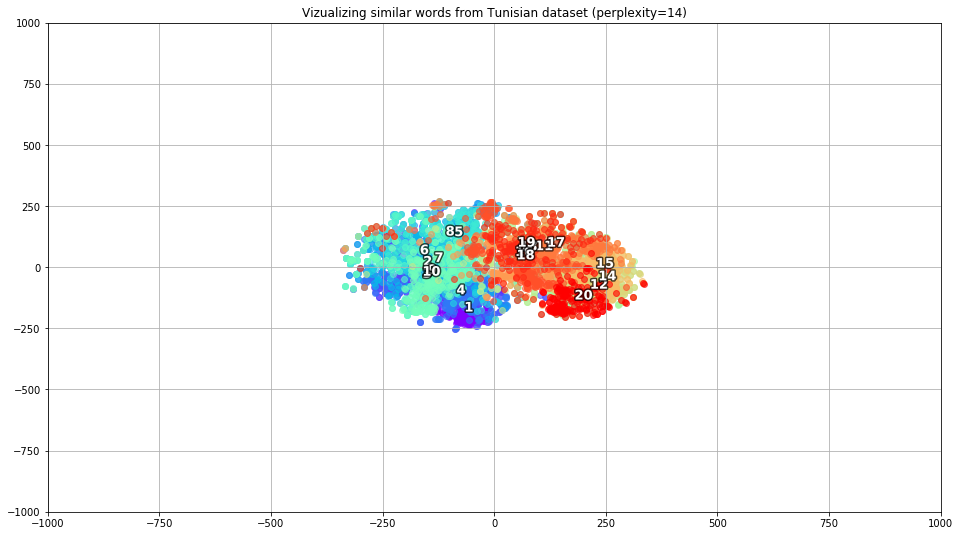

2019-04-29 09:25:41,194 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:25:41,200 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:25:41,206 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:25:41,213 : WARNING : 'c' arg

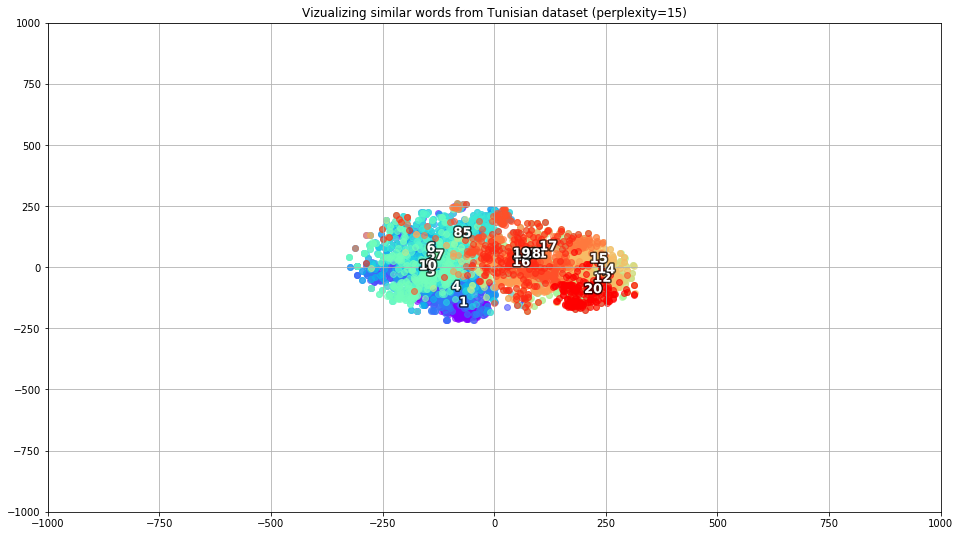

2019-04-29 09:27:48,043 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:27:48,054 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:27:48,065 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:27:48,078 : WARNING : 'c' arg

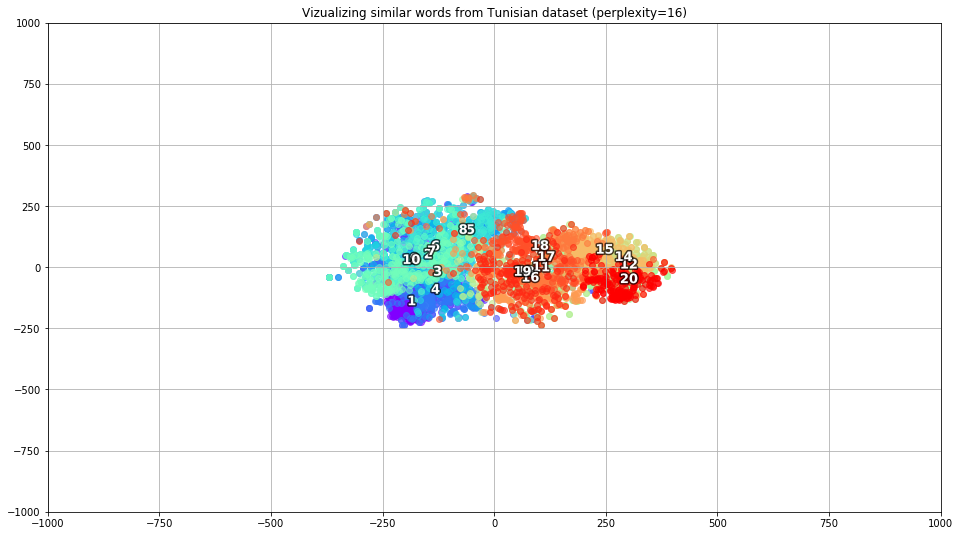

2019-04-29 09:29:50,945 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:29:50,952 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:29:50,962 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:29:50,968 : WARNING : 'c' arg

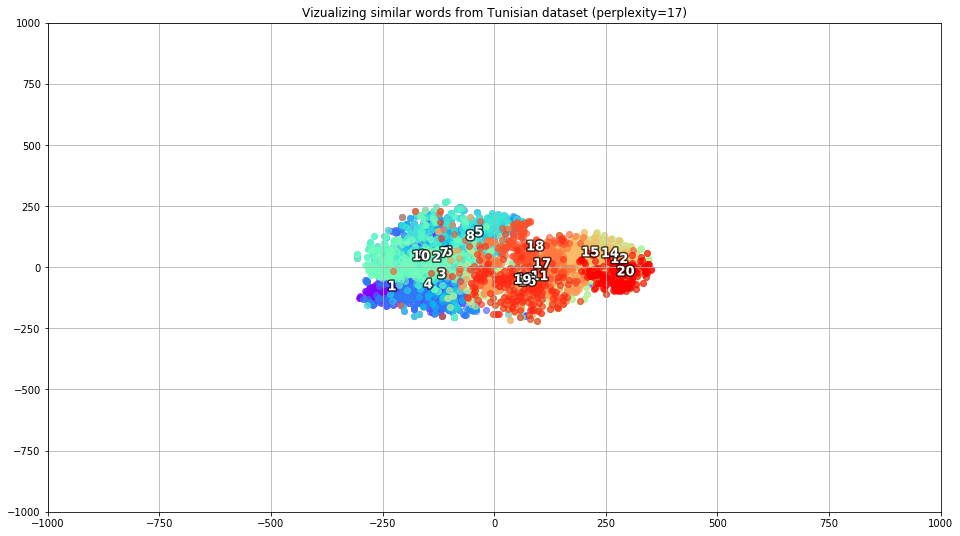

2019-04-29 09:31:58,074 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:31:58,086 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:31:58,094 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:31:58,101 : WARNING : 'c' arg

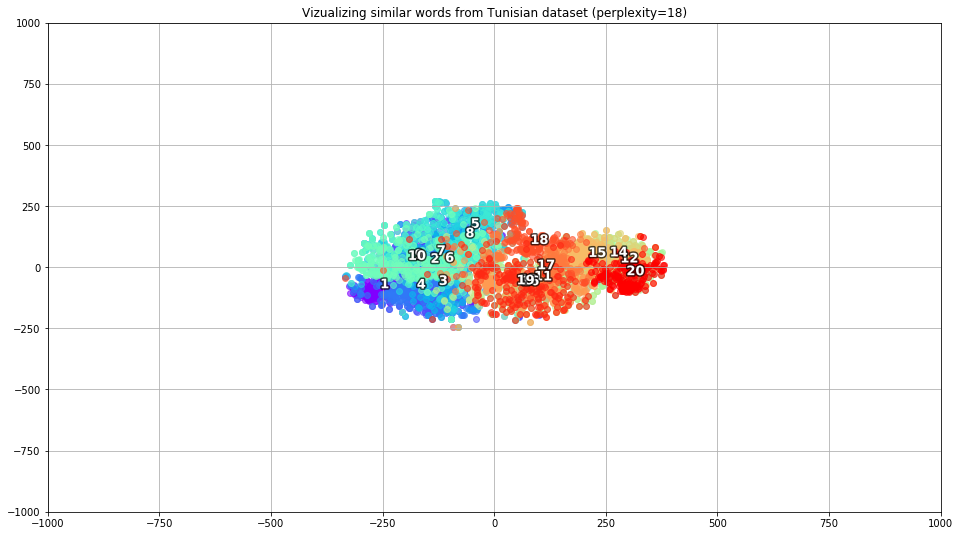

2019-04-29 09:34:07,720 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:34:07,726 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:34:07,732 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:34:07,740 : WARNING : 'c' arg

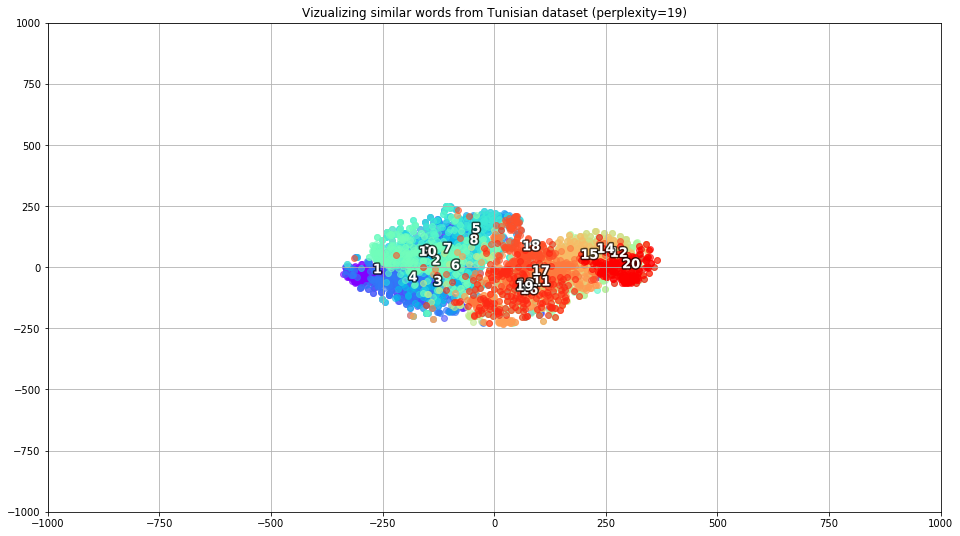

2019-04-29 09:36:17,509 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:36:17,514 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:36:17,520 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:36:17,530 : WARNING : 'c' arg

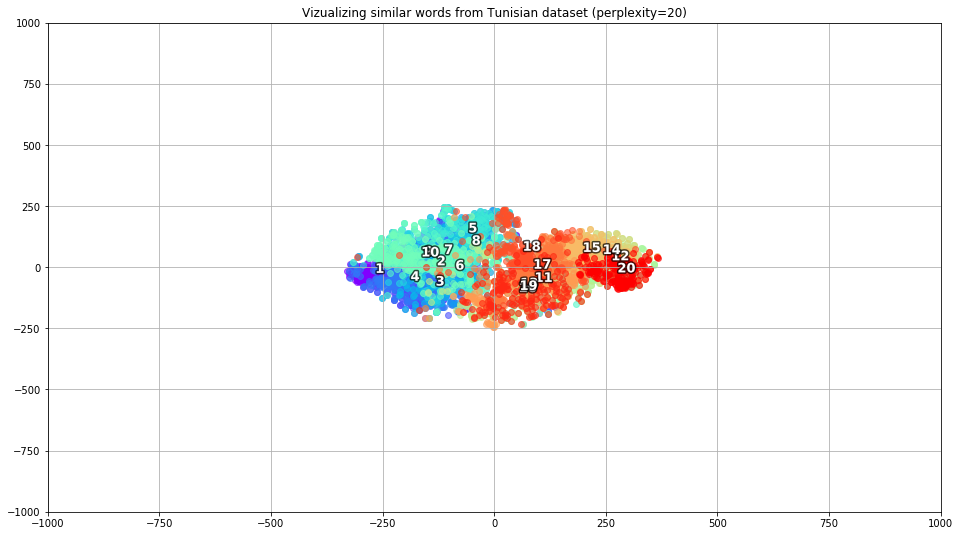

2019-04-29 09:38:26,475 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:38:26,486 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:38:26,495 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:38:26,504 : WARNING : 'c' arg

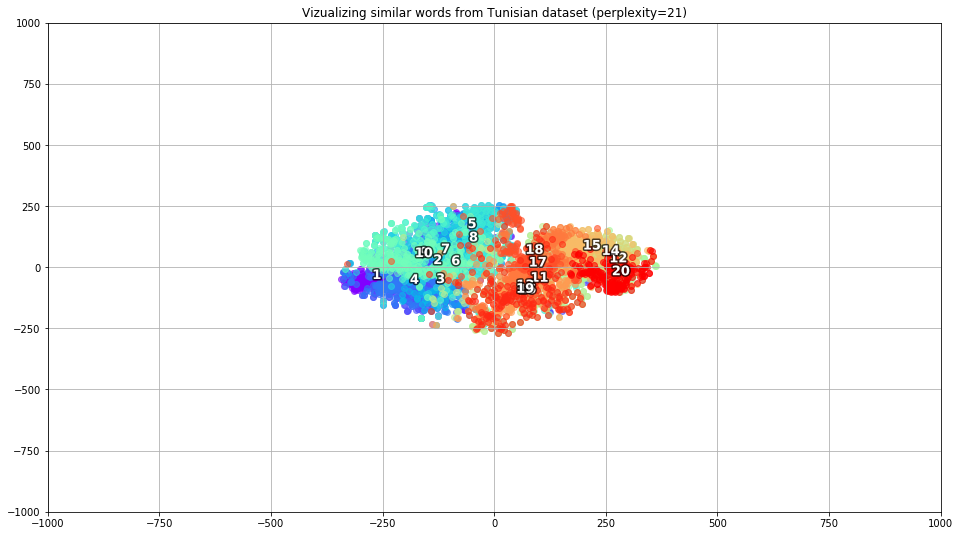

2019-04-29 09:40:35,703 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:40:35,714 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:40:35,723 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:40:35,732 : WARNING : 'c' arg

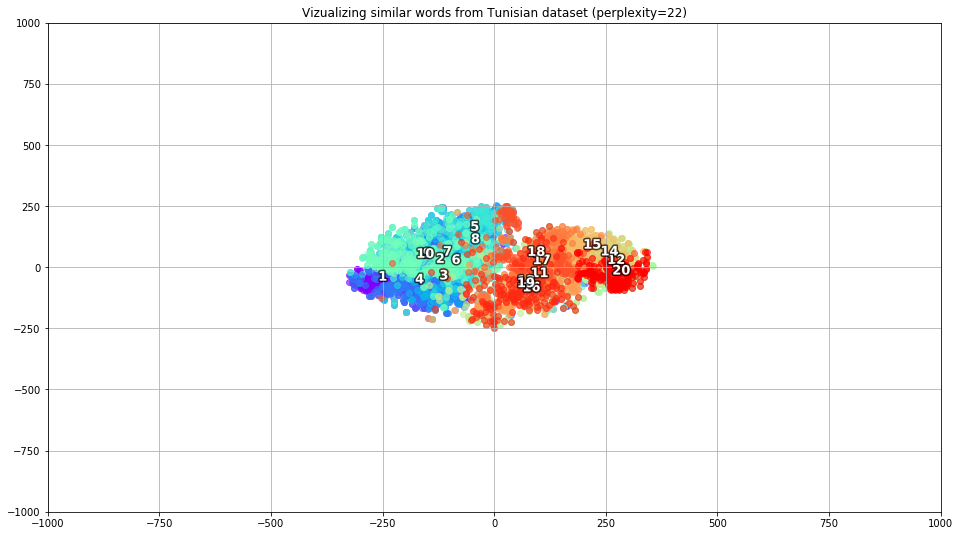

2019-04-29 09:42:49,387 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:42:49,393 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:42:49,400 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:42:49,408 : WARNING : 'c' arg

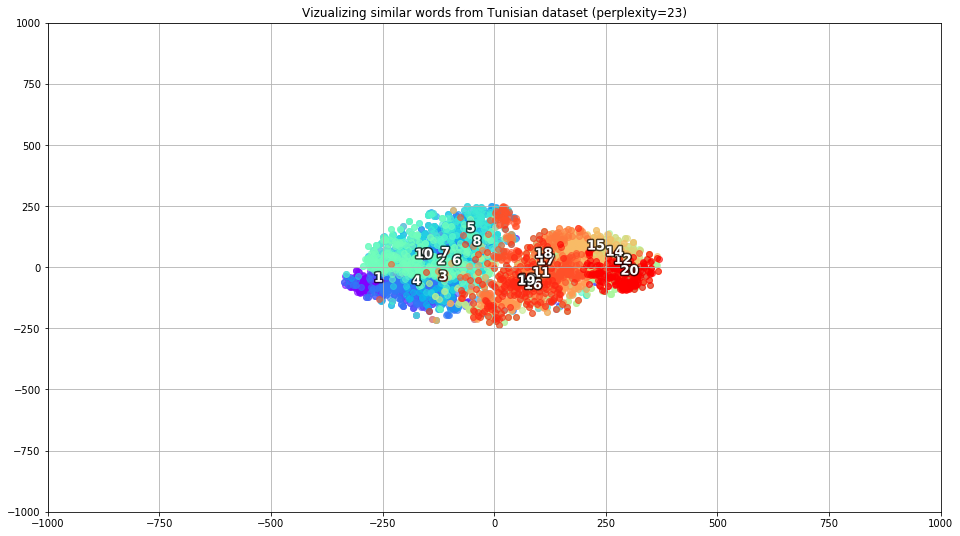

2019-04-29 09:45:06,349 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:45:06,354 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:45:06,360 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:45:06,368 : WARNING : 'c' arg

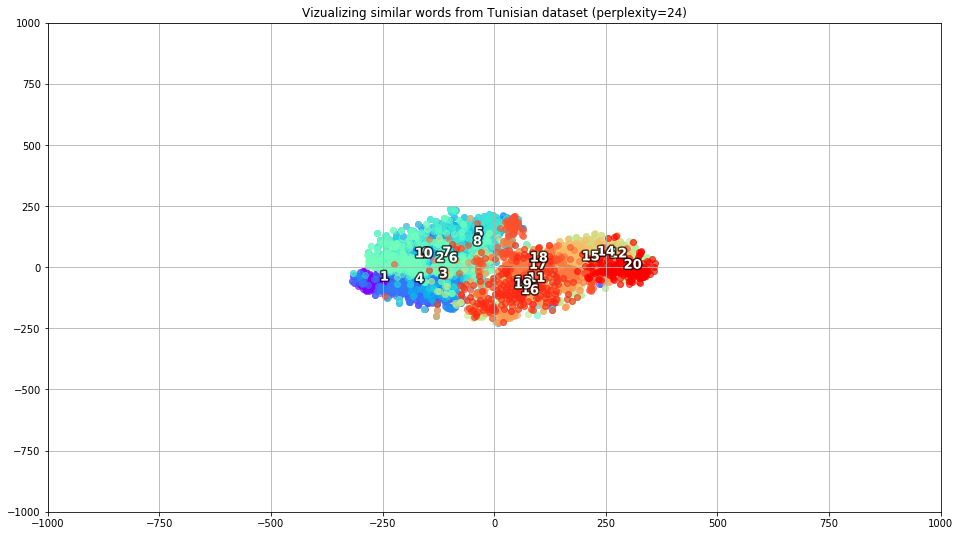

2019-04-29 09:47:22,502 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:47:22,510 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:47:22,518 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:47:22,525 : WARNING : 'c' arg

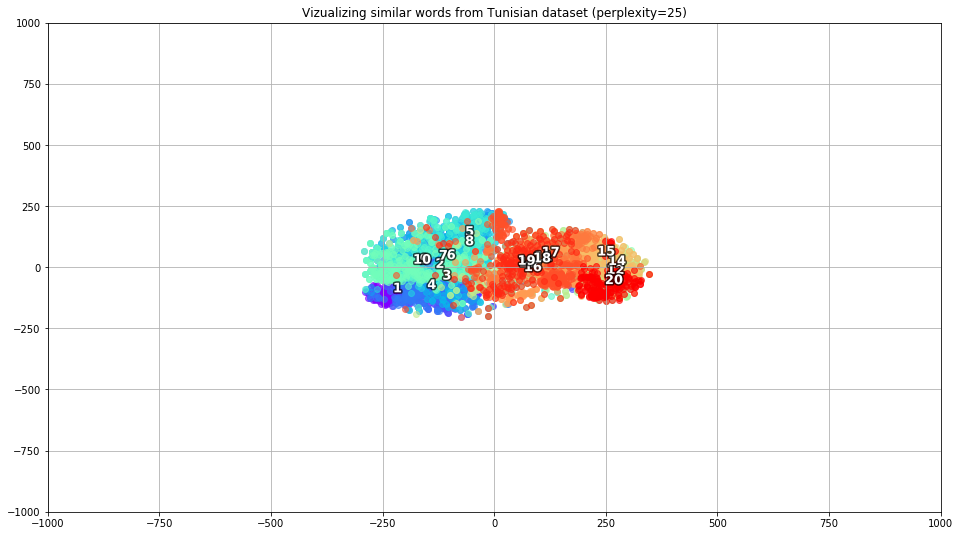

2019-04-29 09:49:43,711 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:49:43,717 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:49:43,725 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:49:43,733 : WARNING : 'c' arg

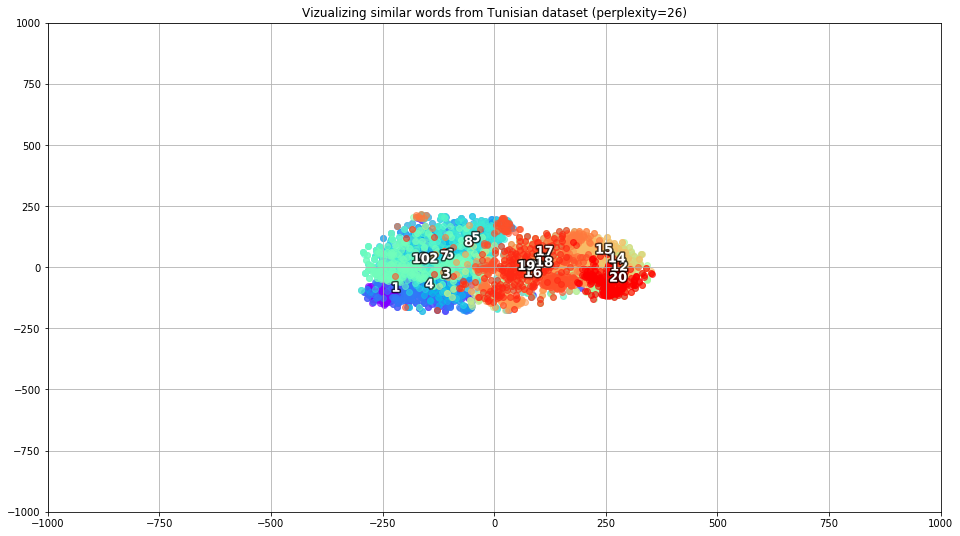

2019-04-29 09:52:01,943 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:52:01,955 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:52:01,963 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:52:01,972 : WARNING : 'c' arg

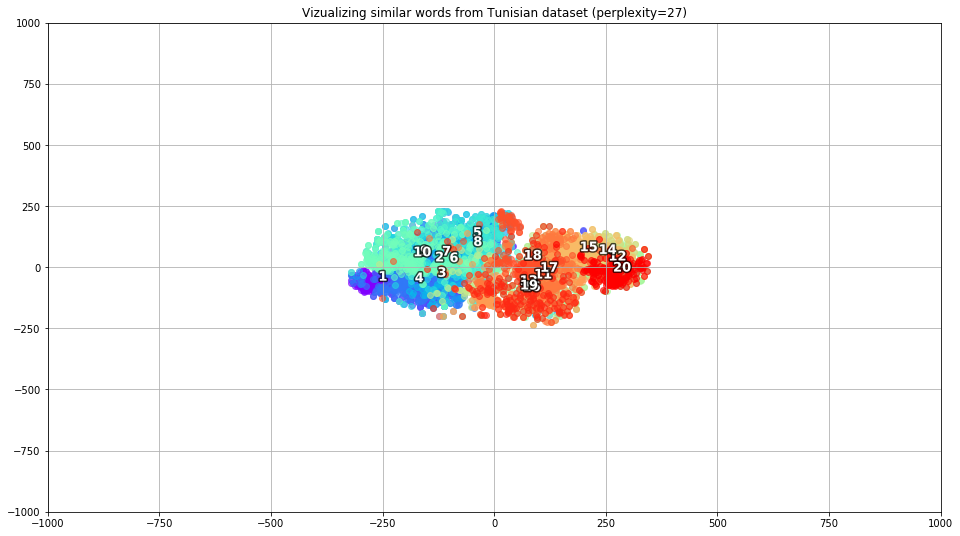

2019-04-29 09:54:24,144 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:54:24,149 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:54:24,158 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:54:24,166 : WARNING : 'c' arg

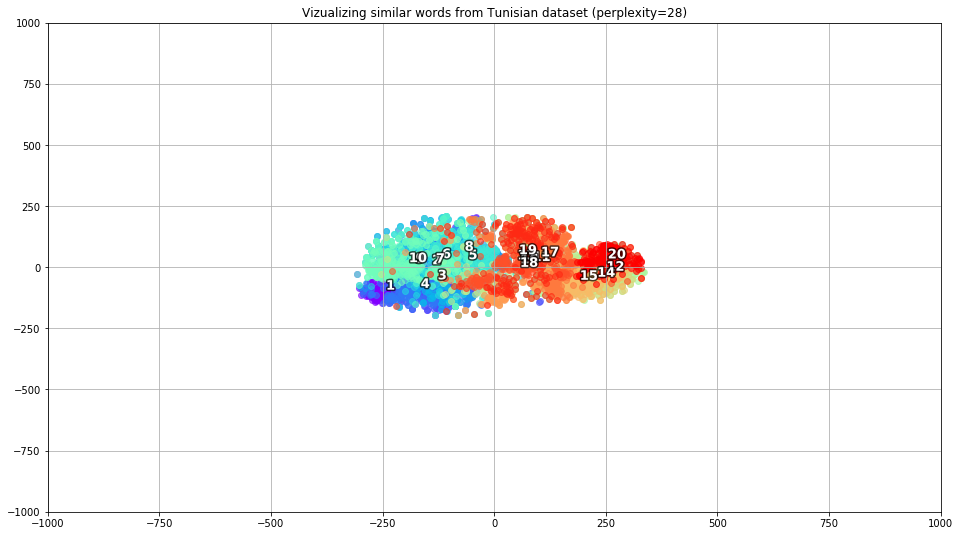

2019-04-29 09:56:41,872 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:56:41,878 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:56:41,882 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:56:41,888 : WARNING : 'c' arg

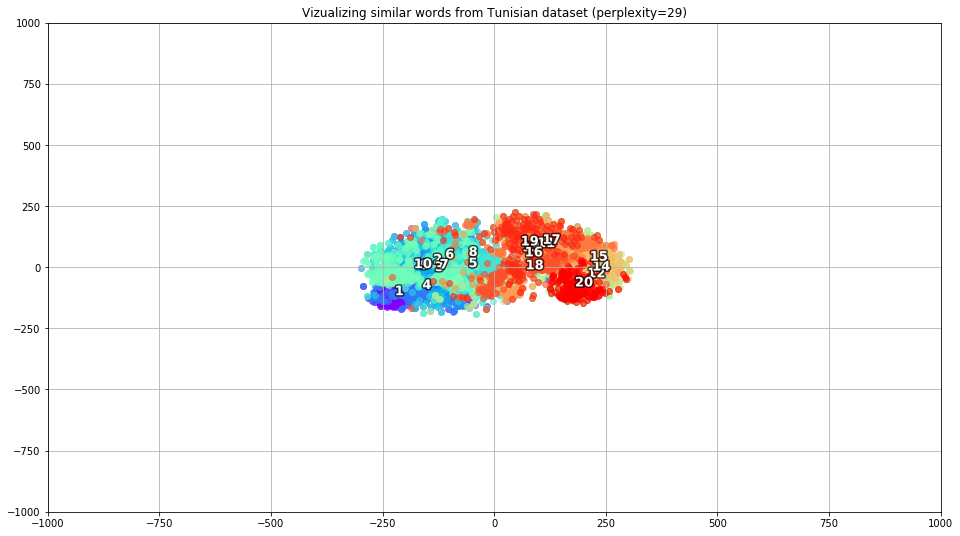

2019-04-29 09:59:00,278 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:59:00,288 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:59:00,298 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 09:59:00,307 : WARNING : 'c' arg

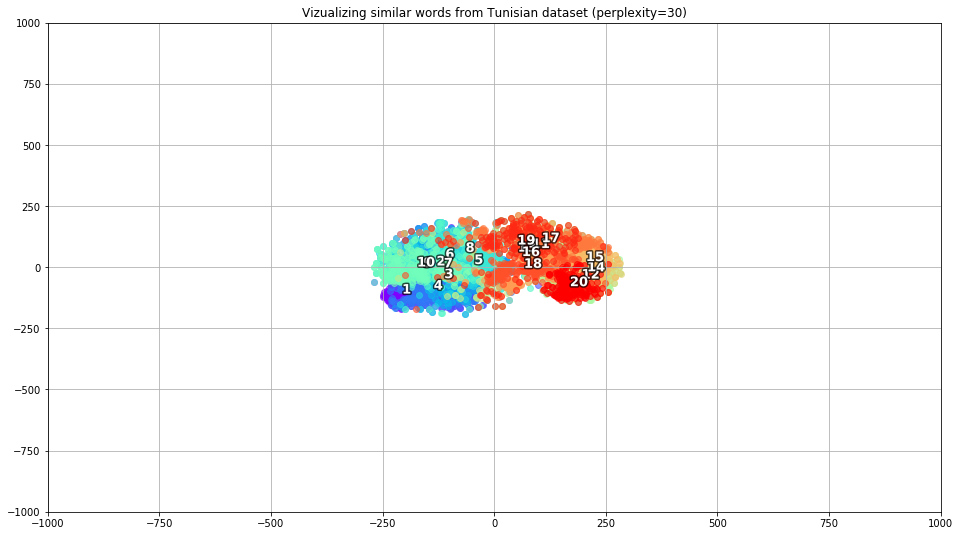

2019-04-29 10:01:23,705 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:01:23,711 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:01:23,716 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:01:23,722 : WARNING : 'c' arg

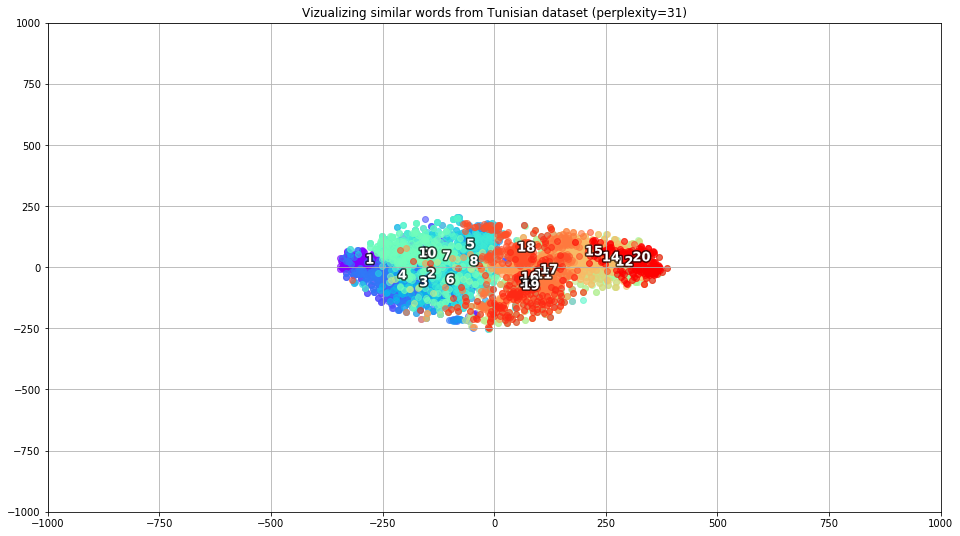

2019-04-29 10:03:47,043 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:03:47,049 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:03:47,054 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:03:47,059 : WARNING : 'c' arg

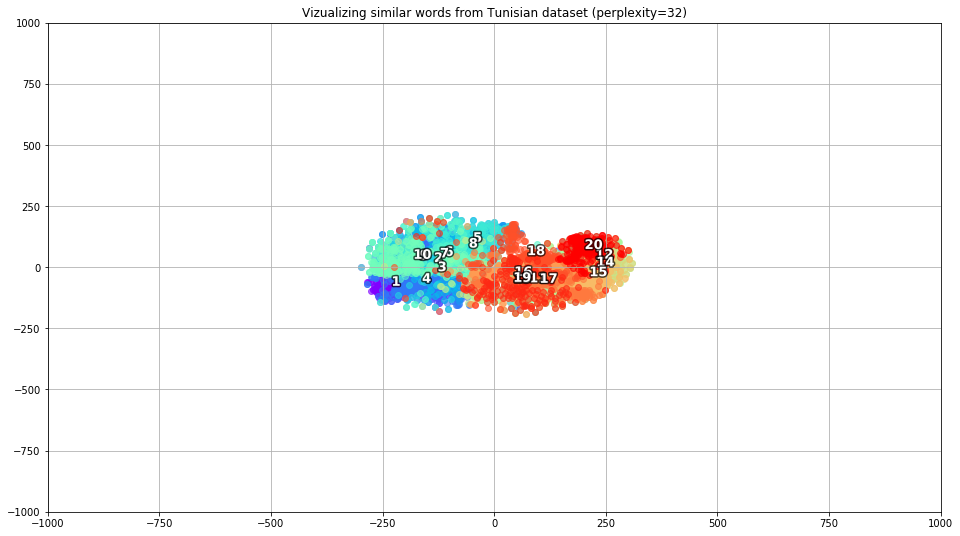

2019-04-29 10:06:13,659 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:06:13,664 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:06:13,670 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:06:13,677 : WARNING : 'c' arg

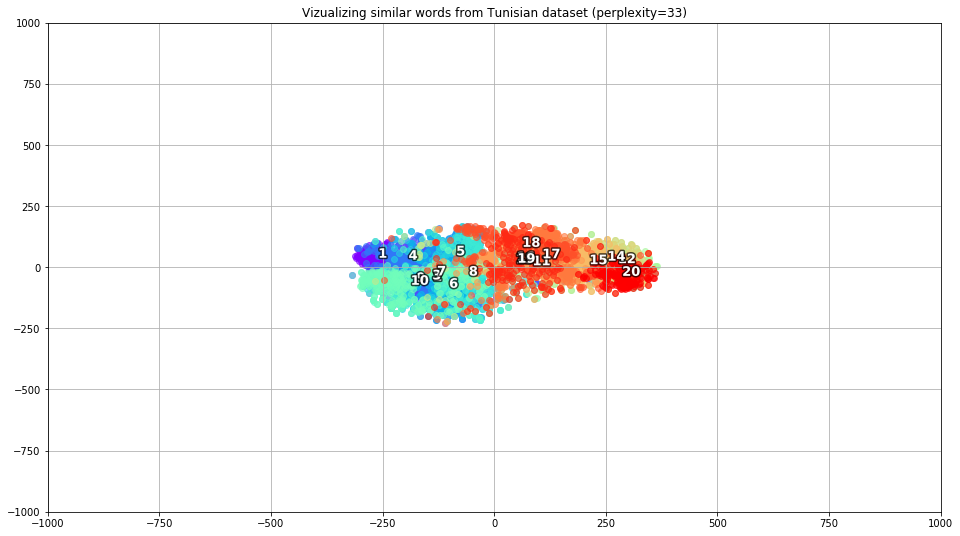

2019-04-29 10:08:37,850 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:08:37,855 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:08:37,861 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:08:37,869 : WARNING : 'c' arg

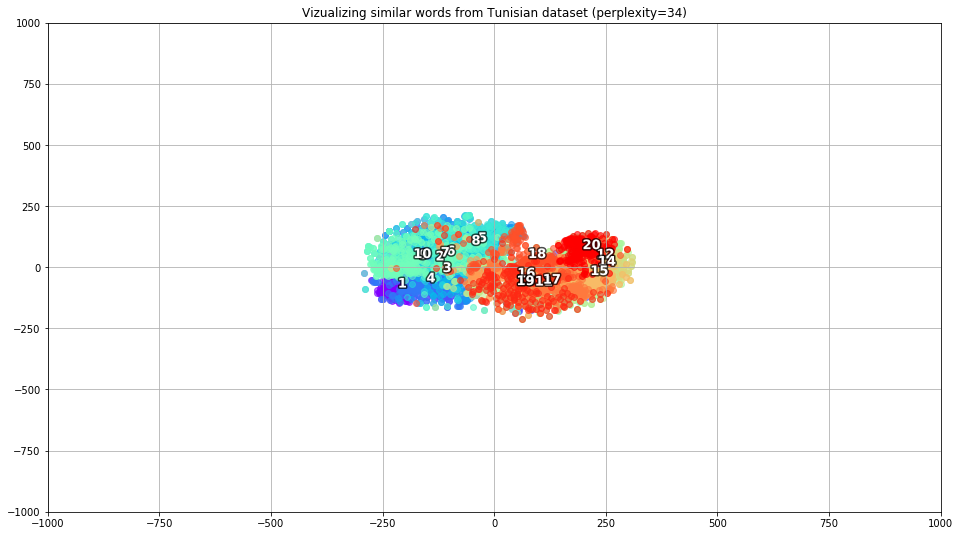

2019-04-29 10:11:04,710 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:11:04,716 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:11:04,724 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:11:04,732 : WARNING : 'c' arg

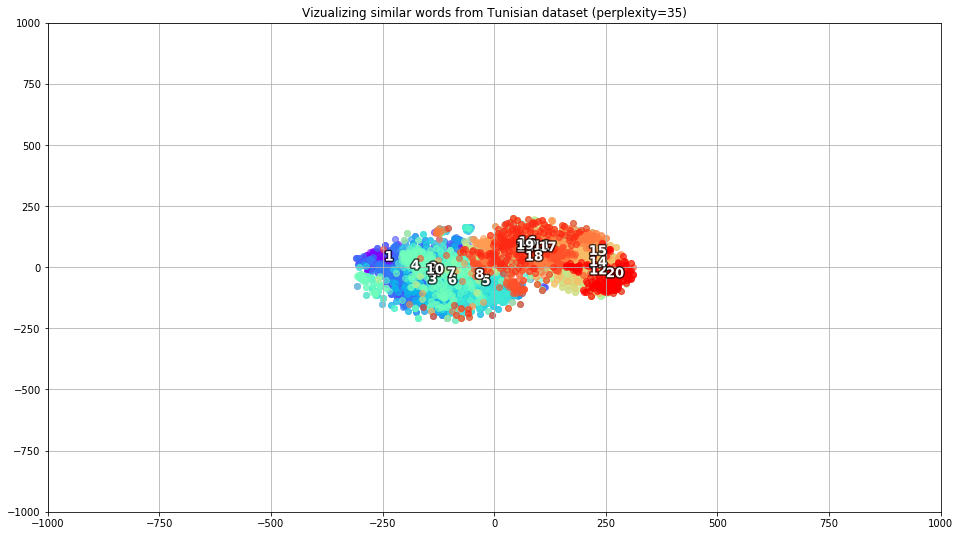

2019-04-29 10:13:40,531 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:13:40,537 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:13:40,544 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:13:40,551 : WARNING : 'c' arg

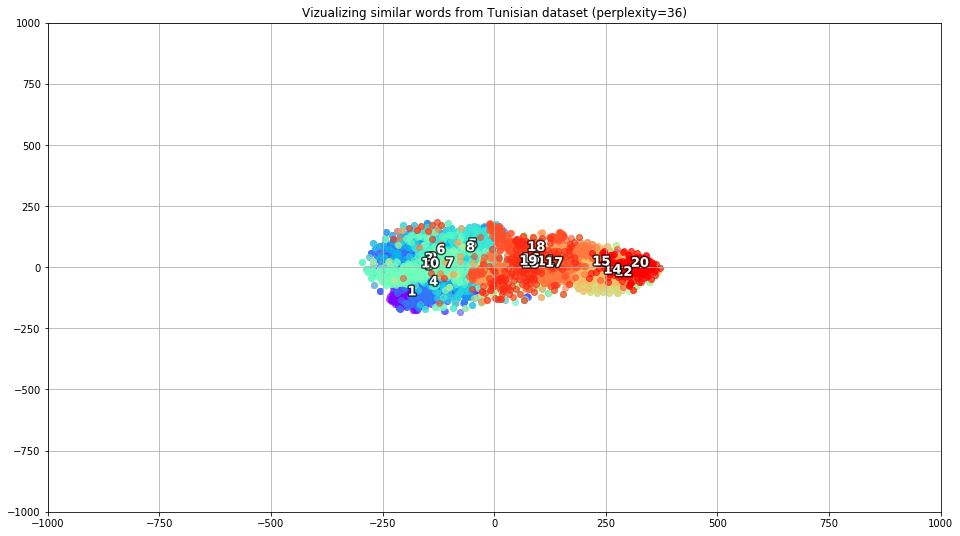

2019-04-29 10:16:07,656 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:16:07,663 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:16:07,672 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:16:07,681 : WARNING : 'c' arg

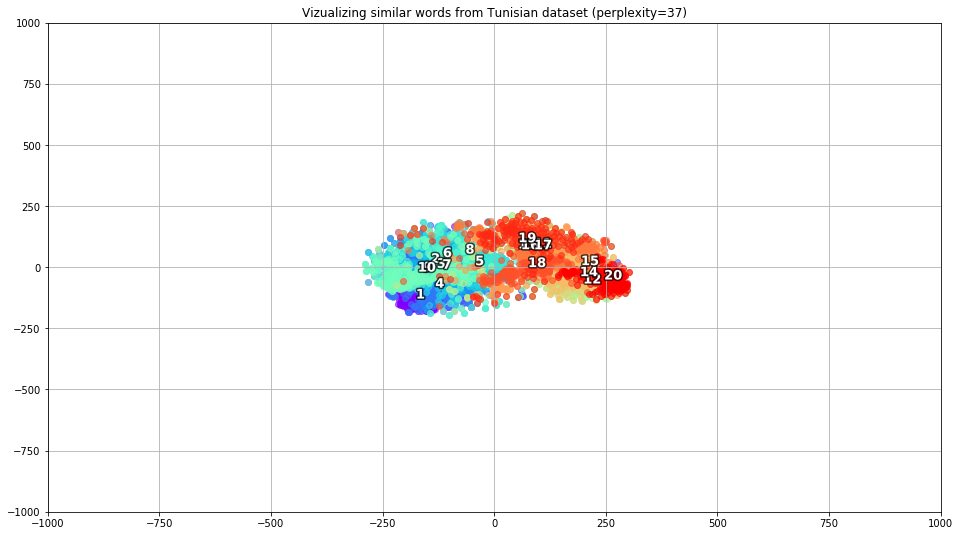

2019-04-29 10:18:31,876 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:18:31,887 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:18:31,895 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 10:18:31,904 : WARNING : 'c' arg

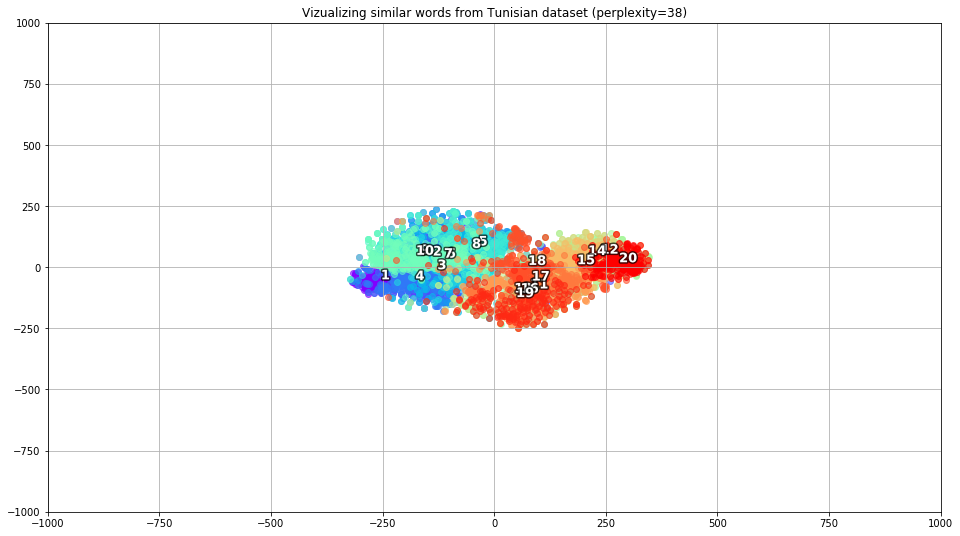

KeyboardInterrupt: ignored

In [0]:
import matplotlib.patheffects as PathEffects
import tempfile
import imageio
import shutil
import os
from sklearn.manifold import TSNE
import matplotlib.cm as cm

def tsne_plot_similar_words_png(title, embedding_clusters, a, filename=None):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(embedding_clusters)))
    i = 1
    for embeddings, color in zip(embedding_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c=color, alpha=a)
        plt.text(x.mean(), y.mean(), str(i), color='white', weight='bold', fontsize=13, path_effects=[PathEffects.withStroke(linewidth=3,
                                                                          foreground="black", alpha=0.7)])
        i += 1
    plt.title(title)
    plt.grid(True)
    plt.xlim(-1000, 1000)
    plt.ylim(-1000, 1000)
    if filename:
        plt.savefig(filename, format='png', dpi=150, bbox_inches='tight')
    plt.show()


#dirpath = tempfile.mkdtemp()
#images = []
for i in range(1, 100):
    #fname = os.path.join(dirpath, str(i) + '.png')
    tsne_model_en_2d_gif = TSNE(perplexity=i, n_components=2, init='pca', n_iter=3500, random_state=32)
    embeddings_en_2d_gif = np.array(tsne_model_en_2d_gif.fit_transform(embedding_clusters_gif.reshape(n * m, k))).reshape(n, m, 2)
    #tsne_plot_similar_words_png('Vizualizing similar words from Tunisian dataset (perplexity={})'.format(i), embeddings_en_2d_gif, 0.6, fname)
    tsne_plot_similar_words_png('Vizualizing similar words from Tunisian dataset (perplexity={})'.format(i), embeddings_en_2d_gif , 0.6)
    #images.append(imageio.imread(fname))
#imageio.mimsave("2d1.gif", images, duration = 0.5)
#shutil.rmtree(dirpath)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # This is added back by InteractiveShellApp.init_path()
2019-04-29 11:13:16,193 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you rea

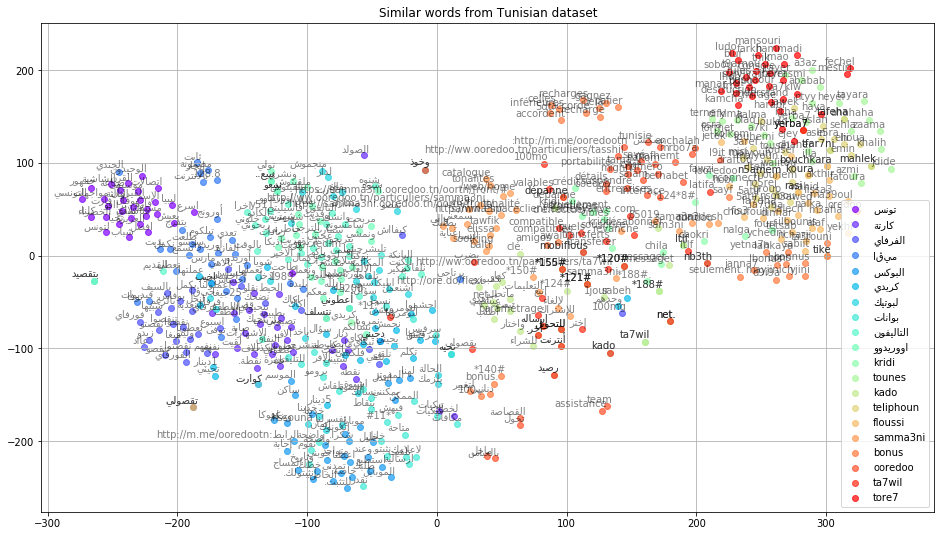

In [0]:
embedding_clusters = []
word_clusters = []

embedding_clusters = []
word_clusters = []
for word in keys_tn:
    embeddings = []
    words = []
    for similar_word, _ in model_tn.most_similar(word, topn=30):
        words.append(similar_word)
        embeddings.append(model_tn[similar_word])
    embedding_clusters.append(embeddings)
    word_clusters.append(words)
    
embedding_clusters = np.array(embedding_clusters)
n, m, k = embedding_clusters.shape
tsne_model_en_2d = TSNE(perplexity=30, n_components=2, init='pca', n_iter=3500, random_state=32)
embeddings_en_2d = np.array(tsne_model_en_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)

def tsne_plot_similar_words(title, labels, embedding_clusters, word_clusters, a, filename=None):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c=color, alpha=a, label=get_display(arabic_reshaper.reshape(label)))
        for i, word in enumerate(words):
            plt.annotate(get_display(arabic_reshaper.reshape(word)), alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
                         textcoords='offset points', ha='right', va='bottom', size=10)
            
    plt.legend(loc=4)
    plt.title(title)
    plt.grid(True)
    if filename:
        plt.savefig(filename, format='png', dpi=150, bbox_inches='tight')
    plt.show()


tsne_plot_similar_words('Similar words from Tunisian dataset', keys_tn, embeddings_en_2d, word_clusters, 0.7)

In [0]:
keys_4c= ['تونسي', 'بوانات', 'samma3ni','forfe']

In [0]:
# Prepare word vectors for visualization

embedding_clusters = []
word_clusters = []

embedding_clusters = []
word_clusters = []
for word in keys_4c:
    embeddings = []
    words = []
    for similar_word, _ in model_tn.most_similar(word, topn=30):
        words.append(similar_word)
        embeddings.append(model_tn[similar_word])
    embedding_clusters.append(embeddings)
    word_clusters.append(words)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if sys.path[0] == '':


In [0]:
embedding_clusters = np.array(embedding_clusters)
n, m, k = embedding_clusters.shape
tsne_model_en_2d = TSNE(perplexity=30, n_components=2, init='pca', n_iter=3500, random_state=32)
embeddings_en_2d = np.array(tsne_model_en_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)

2019-04-29 12:00:05,313 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 12:00:05,429 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 12:00:05,543 : WARNING : 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
2019-04-29 12:00:05,658 : WARNING : 'c' arg

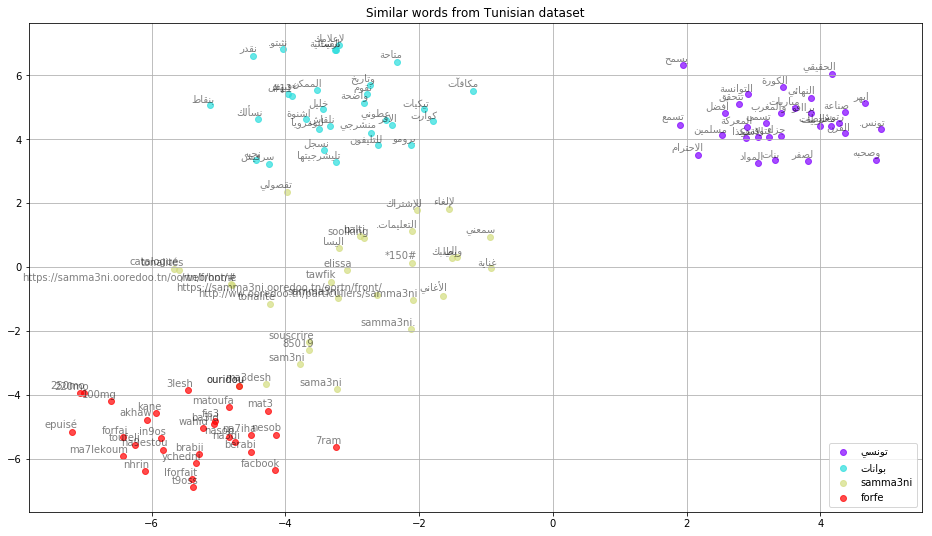

In [0]:
def tsne_plot_similar_words(title, labels, embedding_clusters, word_clusters, a, filename=None):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c=color, alpha=a, label=get_display(arabic_reshaper.reshape(label)))
        for i, word in enumerate(words):
            plt.annotate(get_display(arabic_reshaper.reshape(word)), alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
                         textcoords='offset points', ha='right', va='bottom', size=10)
            
    plt.legend(loc=4)
    plt.title(title)
    plt.grid(True)
    if filename:
        plt.savefig(filename, format='png', dpi=150, bbox_inches='tight')
    plt.show()


tsne_plot_similar_words('Similar words from Tunisian dataset', keys_4c, embeddings_en_2d, word_clusters, 0.7)
